<img src="http://imgur.com/1ZcRyrc.png" style="float: left; margin: 15px; height: 80px">

# Project 3

### Regression and Classification with the Ames Housing Data

---

You have just joined a new "full stack" real estate company in Ames, Iowa. The strategy of the firm is two-fold:
- Own the entire process from the purchase of the land all the way to sale of the house, and anything in between.
- Use statistical analysis to optimize investment and maximize return.

The company is still small, and though investment is substantial the short-term goals of the company are more oriented towards purchasing existing houses and flipping them as opposed to constructing entirely new houses. That being said, the company has access to a large construction workforce operating at rock-bottom prices.

This project uses the [Ames housing data recently made available on kaggle](https://www.kaggle.com/c/house-prices-advanced-regression-techniques).

In [226]:
import numpy as np
import scipy.stats as stats
import seaborn as sns
import matplotlib.pyplot as plt
import pandas as pd
from string import ascii_letters

plt.style.use('ggplot')

%config InlineBackend.figure_format = 'retina'
%matplotlib inline

<img src="http://imgur.com/l5NasQj.png" style="float: left; margin: 25px 15px 0px 0px; height: 25px">

## 1. Estimating the value of homes from fixed characteristics.

---

Your superiors have outlined this year's strategy for the company:
1. Develop an algorithm to reliably estimate the value of residential houses based on *fixed* characteristics.
2. Identify characteristics of houses that the company can cost-effectively change/renovate with their construction team.
3. Evaluate the mean dollar value of different renovations.

Then we can use that to buy houses that are likely to sell for more than the cost of the purchase plus renovations.

Your first job is to tackle #1. You have a dataset of housing sale data with a huge amount of features identifying different aspects of the house. The full description of the data features can be found in a separate file:

    housing.csv
    data_description.txt
    
You need to build a reliable estimator for the price of the house given characteristics of the house that cannot be renovated. Some examples include:
- The neighborhood
- Square feet
- Bedrooms, bathrooms
- Basement and garage space

and many more. 

Some examples of things that **ARE renovateable:**
- Roof and exterior features
- "Quality" metrics, such as kitchen quality
- "Condition" metrics, such as condition of garage
- Heating and electrical components

and generally anything you deem can be modified without having to undergo major construction on the house.

---

**Your goals:**
1. Perform any cleaning, feature engineering, and EDA you deem necessary.
- Be sure to remove any houses that are not residential from the dataset.
- Identify **fixed** features that can predict price.
- Train a model on pre-2010 data and evaluate its performance on the 2010 houses.
- Characterize your model. How well does it perform? What are the best estimates of price?

> **Note:** The EDA and feature engineering component to this project is not trivial! Be sure to always think critically and creatively. Justify your actions! Use the data description file!

## 1 & 2. Filtering, EDA, cleaning, feature engineering

In [227]:
# Load the data
house_df = pd.read_csv('./housing.csv')
house_df

,Id,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,Utilities,...,PoolArea,PoolQC,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition,SalePrice
0,1,60,RL,65.0,8450,Pave,NaN,Reg,Lvl,AllPub,...,0,NaN,NaN,NaN,0,2,2008,WD,Normal,208500
1,2,20,RL,80.0,9600,Pave,NaN,Reg,Lvl,AllPub,...,0,NaN,NaN,NaN,0,5,2007,WD,Normal,181500
2,3,60,RL,68.0,11250,Pave,NaN,IR1,Lvl,AllPub,...,0,NaN,NaN,NaN,0,9,2008,WD,Normal,223500
3,4,70,RL,60.0,9550,Pave,NaN,IR1,Lvl,AllPub,...,0,NaN,NaN,NaN,0,2,2006,WD,Abnorml,140000
4,5,60,RL,84.0,14260,Pave,NaN,IR1,Lvl,AllPub,...,0,NaN,NaN,NaN,0,12,2008,WD,Normal,250000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1455,1456,60,RL,62.0,7917,Pave,NaN,Reg,Lvl,AllPub,...,0,NaN,NaN,NaN,0,8,2007,WD,Normal,175000
1456,1457,20,RL,85.0,13175,Pave,NaN,Reg,Lvl,AllPub,...,0,NaN,MnPrv,NaN,0,2,2010,WD,Normal,210000
1457,1458,70,RL,66.0,9042,Pave,NaN,Reg,Lvl,AllPub,...,0,NaN,GdPrv,Shed,2500,5,2010,WD,Normal,266500
1458,1459,20,RL,68.0,9717,Pave,NaN,Reg,Lvl,AllPub,...,0,NaN,NaN,NaN,0,4,2010,WD,Normal,142125


In [228]:
# Basic - Checking the shape of the dataframe
house_df.shape

(1460, 81)

In [229]:
# Basic - Checking the shape of the dataframe
house_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1460 entries, 0 to 1459
Data columns (total 81 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   Id             1460 non-null   int64  
 1   MSSubClass     1460 non-null   int64  
 2   MSZoning       1460 non-null   object 
 3   LotFrontage    1201 non-null   float64
 4   LotArea        1460 non-null   int64  
 5   Street         1460 non-null   object 
 6   Alley          91 non-null     object 
 7   LotShape       1460 non-null   object 
 8   LandContour    1460 non-null   object 
 9   Utilities      1460 non-null   object 
 10  LotConfig      1460 non-null   object 
 11  LandSlope      1460 non-null   object 
 12  Neighborhood   1460 non-null   object 
 13  Condition1     1460 non-null   object 
 14  Condition2     1460 non-null   object 
 15  BldgType       1460 non-null   object 
 16  HouseStyle     1460 non-null   object 
 17  OverallQual    1460 non-null   int64  
 18  OverallC

In [230]:
# Looking at numerical feature  and categorical features
numerical_features = house_df.dtypes[house_df.dtypes != "object"].index
print("Number of Numerical features: ", len(numerical_features))
categorical_features = house_df.dtypes[house_df.dtypes == "object"].index
print("Number of Categorical features: ", len(categorical_features))
print('-'*50)
print(house_df[numerical_features].columns)
print("-"*50)
print(house_df[categorical_features].columns)

Number of Numerical features:  38
Number of Categorical features:  43
--------------------------------------------------
Index(['Id', 'MSSubClass', 'LotFrontage', 'LotArea', 'OverallQual',
       'OverallCond', 'YearBuilt', 'YearRemodAdd', 'MasVnrArea', 'BsmtFinSF1',
       'BsmtFinSF2', 'BsmtUnfSF', 'TotalBsmtSF', '1stFlrSF', '2ndFlrSF',
       'LowQualFinSF', 'GrLivArea', 'BsmtFullBath', 'BsmtHalfBath', 'FullBath',
       'HalfBath', 'BedroomAbvGr', 'KitchenAbvGr', 'TotRmsAbvGrd',
       'Fireplaces', 'GarageYrBlt', 'GarageCars', 'GarageArea', 'WoodDeckSF',
       'OpenPorchSF', 'EnclosedPorch', '3SsnPorch', 'ScreenPorch', 'PoolArea',
       'MiscVal', 'MoSold', 'YrSold', 'SalePrice'],
      dtype='object')
--------------------------------------------------
Index(['MSZoning', 'Street', 'Alley', 'LotShape', 'LandContour', 'Utilities',
       'LotConfig', 'LandSlope', 'Neighborhood', 'Condition1', 'Condition2',
       'BldgType', 'HouseStyle', 'RoofStyle', 'RoofMatl', 'Exterior1st',
  

In [231]:
# Checking to see how many unique rows there are per category
for catg in list(categorical_features) :
    print(house_df[catg].value_counts())
    print('#'*50)

RL         1151
RM          218
FV           65
RH           16
C (all)      10
Name: MSZoning, dtype: int64
##################################################
Pave    1454
Grvl       6
Name: Street, dtype: int64
##################################################
Grvl    50
Pave    41
Name: Alley, dtype: int64
##################################################
Reg    925
IR1    484
IR2     41
IR3     10
Name: LotShape, dtype: int64
##################################################
Lvl    1311
Bnk      63
HLS      50
Low      36
Name: LandContour, dtype: int64
##################################################
AllPub    1459
NoSeWa       1
Name: Utilities, dtype: int64
##################################################
Inside     1052
Corner      263
CulDSac      94
FR2          47
FR3           4
Name: LotConfig, dtype: int64
##################################################
Gtl    1382
Mod      65
Sev      13
Name: LandSlope, dtype: int64
############################################

In [232]:
# From the below I can see that there are a lot of Null entries. So I decide to replace them with NaN then with none.
total = house_df.isnull().sum().sort_values(ascending=False)
percent = (house_df.isnull().sum()/house_df.isnull().count()).sort_values(ascending=False)
missing_data = pd.concat([total, percent], axis=1, keys=['Total', 'Percent'])
missing_data.head(10)

,Total,Percent
PoolQC,1453,0.995205
MiscFeature,1406,0.963014
Alley,1369,0.937671
Fence,1179,0.807534
FireplaceQu,690,0.472603
LotFrontage,259,0.177397
GarageCond,81,0.055479
GarageType,81,0.055479
GarageYrBlt,81,0.055479
GarageFinish,81,0.055479


In [233]:
# replace 'NaN' with 'None' in these columns. These are columns where there may not neceassarily be values missing
# but actually mean that the house does not have that paricular feature such as Pool, Garage etc.

cols_fillna = ['PoolQC','MiscFeature','Alley','Fence','MasVnrType','FireplaceQu',
               'GarageQual','GarageCond','GarageFinish','GarageType', 'Electrical',
               'KitchenQual', 'SaleType', 'Functional', 'Exterior2nd', 'Exterior1st',
               'BsmtExposure','BsmtCond','BsmtQual','BsmtFinType1','BsmtFinType2',
               'MSZoning', 'Utilities']
for col in cols_fillna:
    house_df[col].fillna('None',inplace=True)

house_df

,Id,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,Utilities,...,PoolArea,PoolQC,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition,SalePrice
0,1,60,RL,65.0,8450,Pave,None,Reg,Lvl,AllPub,...,0,None,None,None,0,2,2008,WD,Normal,208500
1,2,20,RL,80.0,9600,Pave,None,Reg,Lvl,AllPub,...,0,None,None,None,0,5,2007,WD,Normal,181500
2,3,60,RL,68.0,11250,Pave,None,IR1,Lvl,AllPub,...,0,None,None,None,0,9,2008,WD,Normal,223500
3,4,70,RL,60.0,9550,Pave,None,IR1,Lvl,AllPub,...,0,None,None,None,0,2,2006,WD,Abnorml,140000
4,5,60,RL,84.0,14260,Pave,None,IR1,Lvl,AllPub,...,0,None,None,None,0,12,2008,WD,Normal,250000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1455,1456,60,RL,62.0,7917,Pave,None,Reg,Lvl,AllPub,...,0,None,None,None,0,8,2007,WD,Normal,175000
1456,1457,20,RL,85.0,13175,Pave,None,Reg,Lvl,AllPub,...,0,None,MnPrv,None,0,2,2010,WD,Normal,210000
1457,1458,70,RL,66.0,9042,Pave,None,Reg,Lvl,AllPub,...,0,None,GdPrv,Shed,2500,5,2010,WD,Normal,266500
1458,1459,20,RL,68.0,9717,Pave,None,Reg,Lvl,AllPub,...,0,None,None,None,0,4,2010,WD,Normal,142125


In [234]:
# Looking a the columns where there are missing values and outliers (25% / 75% percentile)
list_of_numerics = house_df.select_dtypes(include=['float','int']).columns
types = house_df.dtypes
missing= round((house_df.isnull().sum()/house_df.shape[0]),3)*100
overview = house_df.apply(lambda x: [round(x.min()), 
                                 round(x.max()), 
                                 round(x.mean()), 
                                 round(x.quantile(0.5))] if x.name in list_of_numerics else x.unique())
outliers= round((house_df.apply(lambda x: sum(
                                 (x<(x.quantile(0.25)-1.5*(x.quantile(0.75)-x.quantile(0.25))))|
                                 (x>(x.quantile(0.75)+1.5*(x.quantile(0.75)-x.quantile(0.25))))
                                 if x.name in list_of_numerics else ''))/house_df.shape[0]), 3)*100
explo = pd.DataFrame({'Types': types,
                      'Missing%': missing,
                      'Overview': overview,
                      'Outliers%': outliers}).sort_values(by=['Outliers%','Types'])
explo.sort_values(by='Missing%', ascending=False).head(60)

,Types,Missing%,Overview,Outliers%
LotFrontage,float64,17.7,"[21, 313, 70.0, 69]",6.0
GarageYrBlt,float64,5.5,"[1900, 2010, 1979.0, 1980]",0.0
MasVnrArea,float64,0.5,"[0, 1600, 104.0, 0]",6.6
Id,int64,0.0,"[1, 1460, 730.0, 730]",0.0
2ndFlrSF,int64,0.0,"[0, 2065, 347.0, 0]",0.1
1stFlrSF,int64,0.0,"[334, 4692, 1163.0, 1087]",1.4
PoolArea,int64,0.0,"[0, 738, 3.0, 0]",0.5
BsmtFinSF1,int64,0.0,"[0, 5644, 444.0, 384]",0.5
YearBuilt,int64,0.0,"[1872, 2010, 1971.0, 1973]",0.5
GarageCars,int64,0.0,"[0, 4, 2.0, 2]",0.3


In [235]:
house_df.GarageYrBlt.unique()

array([2003., 1976., 2001., 1998., 2000., 1993., 2004., 1973., 1931.,
       1939., 1965., 2005., 1962., 2006., 1960., 1991., 1970., 1967.,
       1958., 1930., 2002., 1968., 2007., 2008., 1957., 1920., 1966.,
       1959., 1995., 1954., 1953.,   nan, 1983., 1977., 1997., 1985.,
       1963., 1981., 1964., 1999., 1935., 1990., 1945., 1987., 1989.,
       1915., 1956., 1948., 1974., 2009., 1950., 1961., 1921., 1900.,
       1979., 1951., 1969., 1936., 1975., 1971., 1923., 1984., 1926.,
       1955., 1986., 1988., 1916., 1932., 1972., 1918., 1980., 1924.,
       1996., 1940., 1949., 1994., 1910., 1978., 1982., 1992., 1925.,
       1941., 2010., 1927., 1947., 1937., 1942., 1938., 1952., 1928.,
       1922., 1934., 1906., 1914., 1946., 1908., 1929., 1933.])

In [236]:
house_df_corr = house_df.corr()

In [237]:
sp_table = house_df_corr['SalePrice'].sort_values(ascending=False).to_frame()
cm = sns.light_palette("green", as_cmap=True)
sp_corr = sp_table.style.background_gradient(cmap=cm)
sp_corr

,SalePrice
SalePrice,1.000000
OverallQual,0.790982
GrLivArea,0.708624
GarageCars,0.640409
GarageArea,0.623431
TotalBsmtSF,0.613581
1stFlrSF,0.605852
FullBath,0.560664
TotRmsAbvGrd,0.533723
YearBuilt,0.522897


In [238]:
# There are 17.7% of missing values in LotFrontage (the linear feet of street connected to property), which I decide
# to fill with the mean rather than delete.

house_df.LotFrontage.fillna(house_df.LotFrontage.mean(), inplace=True)
house_df

,Id,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,Utilities,...,PoolArea,PoolQC,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition,SalePrice
0,1,60,RL,65.0,8450,Pave,None,Reg,Lvl,AllPub,...,0,None,None,None,0,2,2008,WD,Normal,208500
1,2,20,RL,80.0,9600,Pave,None,Reg,Lvl,AllPub,...,0,None,None,None,0,5,2007,WD,Normal,181500
2,3,60,RL,68.0,11250,Pave,None,IR1,Lvl,AllPub,...,0,None,None,None,0,9,2008,WD,Normal,223500
3,4,70,RL,60.0,9550,Pave,None,IR1,Lvl,AllPub,...,0,None,None,None,0,2,2006,WD,Abnorml,140000
4,5,60,RL,84.0,14260,Pave,None,IR1,Lvl,AllPub,...,0,None,None,None,0,12,2008,WD,Normal,250000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1455,1456,60,RL,62.0,7917,Pave,None,Reg,Lvl,AllPub,...,0,None,None,None,0,8,2007,WD,Normal,175000
1456,1457,20,RL,85.0,13175,Pave,None,Reg,Lvl,AllPub,...,0,None,MnPrv,None,0,2,2010,WD,Normal,210000
1457,1458,70,RL,66.0,9042,Pave,None,Reg,Lvl,AllPub,...,0,None,GdPrv,Shed,2500,5,2010,WD,Normal,266500
1458,1459,20,RL,68.0,9717,Pave,None,Reg,Lvl,AllPub,...,0,None,None,None,0,4,2010,WD,Normal,142125


In [239]:
#There is 5% of the data missing, since it is so small I will replace the missing values with the mean.

house_df.GarageYrBlt.fillna(house_df.GarageYrBlt.mean(), inplace=True)
house_df

,Id,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,Utilities,...,PoolArea,PoolQC,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition,SalePrice
0,1,60,RL,65.0,8450,Pave,None,Reg,Lvl,AllPub,...,0,None,None,None,0,2,2008,WD,Normal,208500
1,2,20,RL,80.0,9600,Pave,None,Reg,Lvl,AllPub,...,0,None,None,None,0,5,2007,WD,Normal,181500
2,3,60,RL,68.0,11250,Pave,None,IR1,Lvl,AllPub,...,0,None,None,None,0,9,2008,WD,Normal,223500
3,4,70,RL,60.0,9550,Pave,None,IR1,Lvl,AllPub,...,0,None,None,None,0,2,2006,WD,Abnorml,140000
4,5,60,RL,84.0,14260,Pave,None,IR1,Lvl,AllPub,...,0,None,None,None,0,12,2008,WD,Normal,250000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1455,1456,60,RL,62.0,7917,Pave,None,Reg,Lvl,AllPub,...,0,None,None,None,0,8,2007,WD,Normal,175000
1456,1457,20,RL,85.0,13175,Pave,None,Reg,Lvl,AllPub,...,0,None,MnPrv,None,0,2,2010,WD,Normal,210000
1457,1458,70,RL,66.0,9042,Pave,None,Reg,Lvl,AllPub,...,0,None,GdPrv,Shed,2500,5,2010,WD,Normal,266500
1458,1459,20,RL,68.0,9717,Pave,None,Reg,Lvl,AllPub,...,0,None,None,None,0,4,2010,WD,Normal,142125


In [240]:
house_df.GarageYrBlt.unique()

array([2003.        , 1976.        , 2001.        , 1998.        ,
       2000.        , 1993.        , 2004.        , 1973.        ,
       1931.        , 1939.        , 1965.        , 2005.        ,
       1962.        , 2006.        , 1960.        , 1991.        ,
       1970.        , 1967.        , 1958.        , 1930.        ,
       2002.        , 1968.        , 2007.        , 2008.        ,
       1957.        , 1920.        , 1966.        , 1959.        ,
       1995.        , 1954.        , 1953.        , 1978.50616389,
       1983.        , 1977.        , 1997.        , 1985.        ,
       1963.        , 1981.        , 1964.        , 1999.        ,
       1935.        , 1990.        , 1945.        , 1987.        ,
       1989.        , 1915.        , 1956.        , 1948.        ,
       1974.        , 2009.        , 1950.        , 1961.        ,
       1921.        , 1900.        , 1979.        , 1951.        ,
       1969.        , 1936.        , 1975.        , 1971.     

In [241]:
#There is 0.5% of the data missing, since it is so small I will replace the missing values with the mean.

house_df.MasVnrArea.fillna(house_df.MasVnrArea.mean(), inplace=True)
house_df

,Id,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,Utilities,...,PoolArea,PoolQC,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition,SalePrice
0,1,60,RL,65.0,8450,Pave,None,Reg,Lvl,AllPub,...,0,None,None,None,0,2,2008,WD,Normal,208500
1,2,20,RL,80.0,9600,Pave,None,Reg,Lvl,AllPub,...,0,None,None,None,0,5,2007,WD,Normal,181500
2,3,60,RL,68.0,11250,Pave,None,IR1,Lvl,AllPub,...,0,None,None,None,0,9,2008,WD,Normal,223500
3,4,70,RL,60.0,9550,Pave,None,IR1,Lvl,AllPub,...,0,None,None,None,0,2,2006,WD,Abnorml,140000
4,5,60,RL,84.0,14260,Pave,None,IR1,Lvl,AllPub,...,0,None,None,None,0,12,2008,WD,Normal,250000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1455,1456,60,RL,62.0,7917,Pave,None,Reg,Lvl,AllPub,...,0,None,None,None,0,8,2007,WD,Normal,175000
1456,1457,20,RL,85.0,13175,Pave,None,Reg,Lvl,AllPub,...,0,None,MnPrv,None,0,2,2010,WD,Normal,210000
1457,1458,70,RL,66.0,9042,Pave,None,Reg,Lvl,AllPub,...,0,None,GdPrv,Shed,2500,5,2010,WD,Normal,266500
1458,1459,20,RL,68.0,9717,Pave,None,Reg,Lvl,AllPub,...,0,None,None,None,0,4,2010,WD,Normal,142125


In [242]:
house_df.MasVnrArea.unique()

array([1.96000000e+02, 0.00000000e+00, 1.62000000e+02, 3.50000000e+02,
       1.86000000e+02, 2.40000000e+02, 2.86000000e+02, 3.06000000e+02,
       2.12000000e+02, 1.80000000e+02, 3.80000000e+02, 2.81000000e+02,
       6.40000000e+02, 2.00000000e+02, 2.46000000e+02, 1.32000000e+02,
       6.50000000e+02, 1.01000000e+02, 4.12000000e+02, 2.72000000e+02,
       4.56000000e+02, 1.03100000e+03, 1.78000000e+02, 5.73000000e+02,
       3.44000000e+02, 2.87000000e+02, 1.67000000e+02, 1.11500000e+03,
       4.00000000e+01, 1.04000000e+02, 5.76000000e+02, 4.43000000e+02,
       4.68000000e+02, 6.60000000e+01, 2.20000000e+01, 2.84000000e+02,
       7.60000000e+01, 2.03000000e+02, 6.80000000e+01, 1.83000000e+02,
       4.80000000e+01, 2.80000000e+01, 3.36000000e+02, 6.00000000e+02,
       7.68000000e+02, 4.80000000e+02, 2.20000000e+02, 1.84000000e+02,
       1.12900000e+03, 1.16000000e+02, 1.35000000e+02, 2.66000000e+02,
       8.50000000e+01, 3.09000000e+02, 1.36000000e+02, 2.88000000e+02,
      

In [243]:
# Now I remove Commercial properties so that they do not influence the model if we are only looking 
# to predict residential house prices

house_df = house_df[house_df.MSZoning !='C (all)']
house_df.MSZoning.unique()

array(['RL', 'RM', 'FV', 'RH'], dtype=object)

In [244]:
house_df.shape

(1450, 81)

In [245]:
house_df.isnull().sum().sum()

0

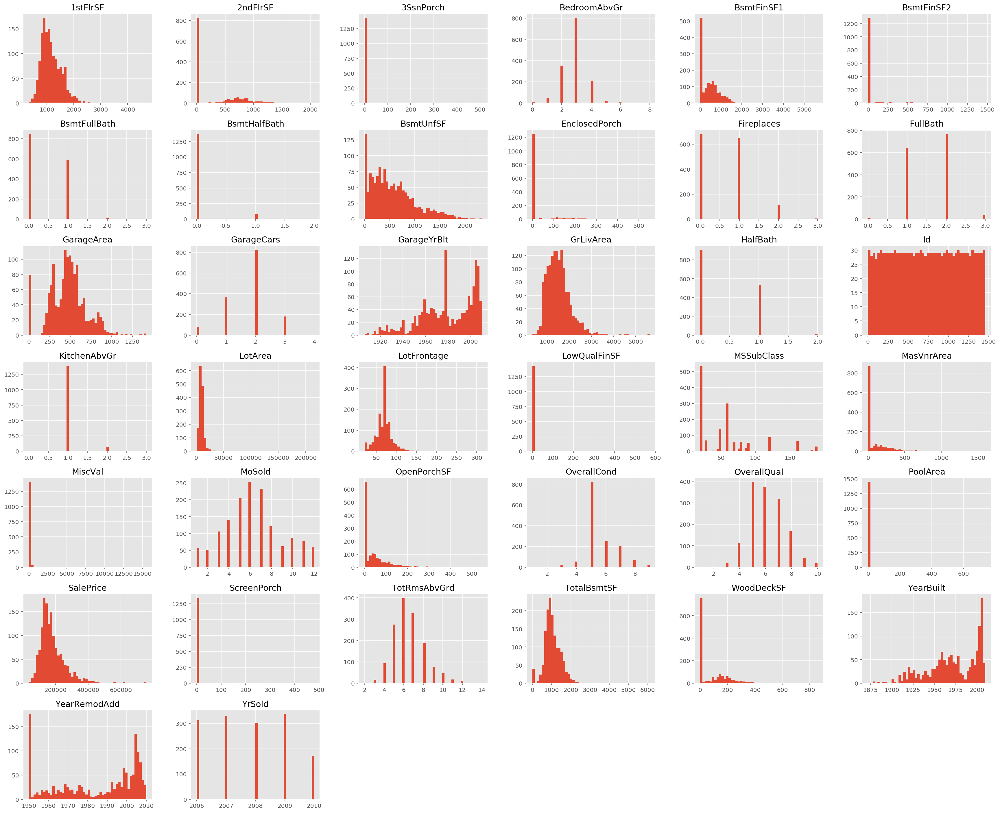

In [246]:
# Finally, many of the histograms are tail-heavy: they extend much farther to the right of the mean.
# This may make it a bit harder for some Machine Learning algorithms to detect patterns. 
# It might be beneficial to tranform the these variables by tranforming them, this will help in the modelling.

house_df.hist(bins=50, figsize=(30,25))
plt.show()

In [247]:
# Defining plot function, and looking at numerical features and the correlation to SalePrice and 
# I log transform SalePrice. There are many outliers that I am considering whether to remove but I may only do 
# so after the modelling. As I am not sure whether any of these amounts are acutally outliers and since if I remove
# it is likely to influence on the model and its predictive capability on unseen data. I prefer to leave them in.

# Later on I create a few new features, basically just aggregating features that are in the same category, such as 
# total bath.

def plot_outlier(x,y):
    tmp = x.dropna()
    skew_value = tmp.skew()
    y = np.log1p(y)
    print('sample lengh: %s   and skew: %s'%(len(x),skew_value))
    fig,axs = plt.subplots(1,2,figsize=(15,5))
    sns.boxplot(x,orient = 'v',ax = axs[0])
    sns.regplot(x,y,ax = axs[1])
    plt.tight_layout()

sample lengh: 1450   and skew: 2.392138232580833


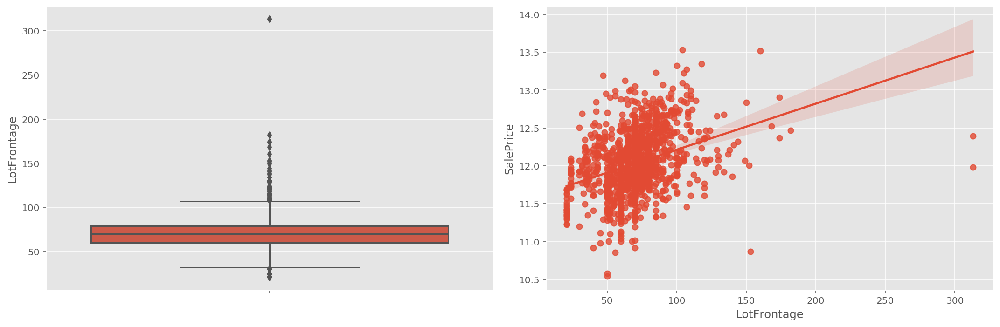

In [248]:
plot_outlier(house_df.LotFrontage,house_df.SalePrice)

sample lengh: 1450   and skew: 12.17620931499111


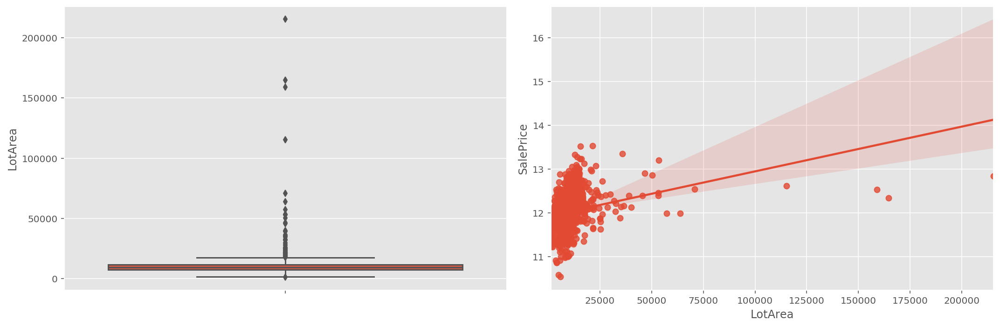

In [249]:
plot_outlier(house_df.LotArea,house_df.SalePrice)

sample lengh: 1450   and skew: 0.23713777171727426


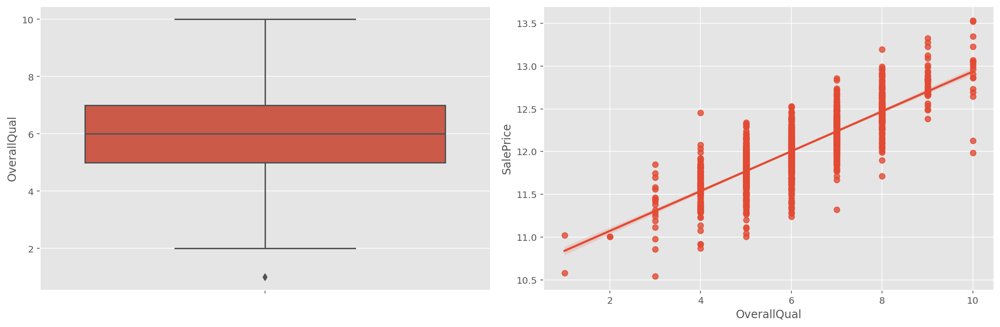

In [250]:
plot_outlier(house_df.OverallQual,house_df.SalePrice)

> However, in Overall Condition the Sale Price goes down with increase in overall condition. This is a strange trend. 

sample lengh: 1450   and skew: 0.7265701305583583


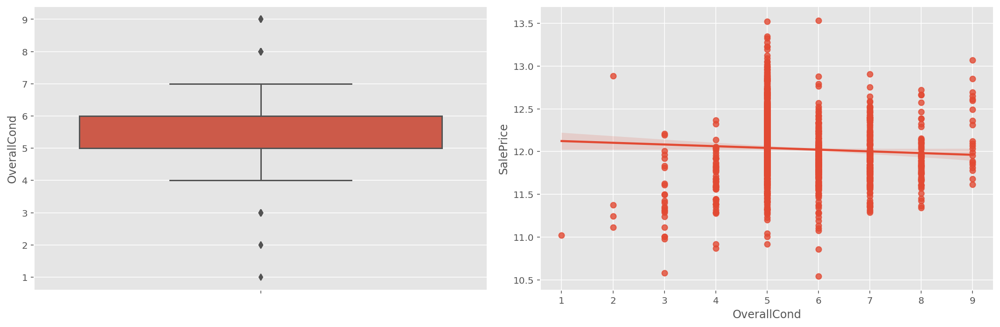

In [251]:
plot_outlier(house_df.OverallCond,house_df.SalePrice)

> With the YearBuild and YearRemodAdd, these two are positively correlated to SalePrice.

sample lengh: 1450   and skew: -0.6263270390096121


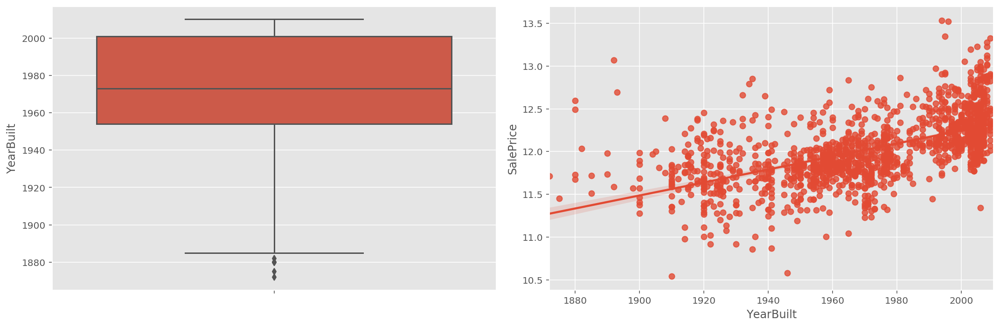

In [252]:
plot_outlier(house_df.YearBuilt,house_df.SalePrice)

sample lengh: 1450   and skew: -0.514579104944237


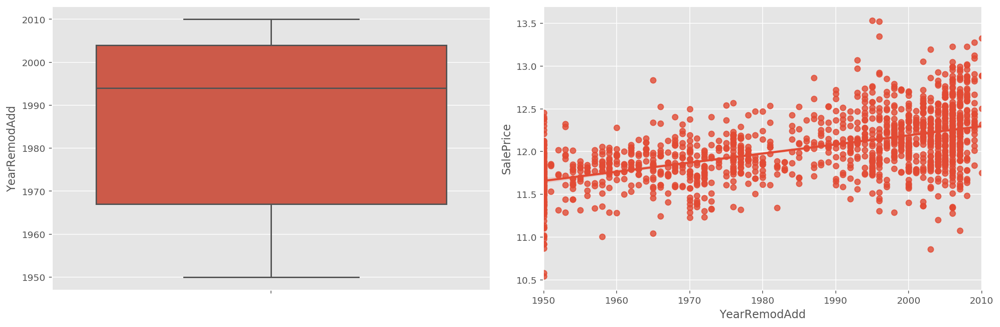

In [253]:
plot_outlier(house_df.YearRemodAdd,house_df.SalePrice)

sample lengh: 1450   and skew: 2.6658091311619097


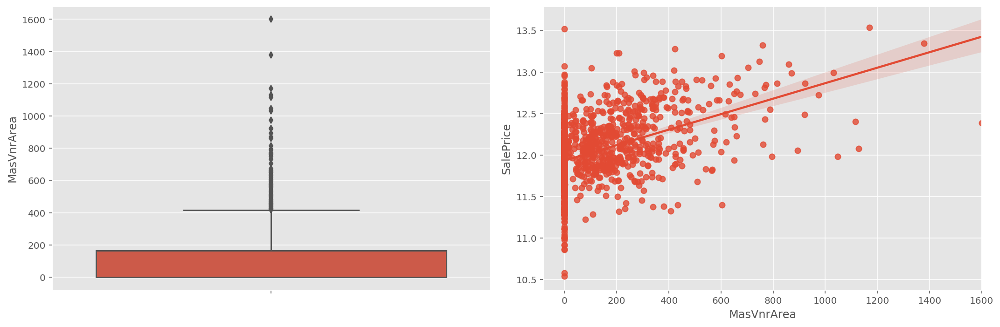

In [254]:
plot_outlier(house_df.MasVnrArea,house_df.SalePrice)

sample lengh: 1450   and skew: 1.6868833901850429


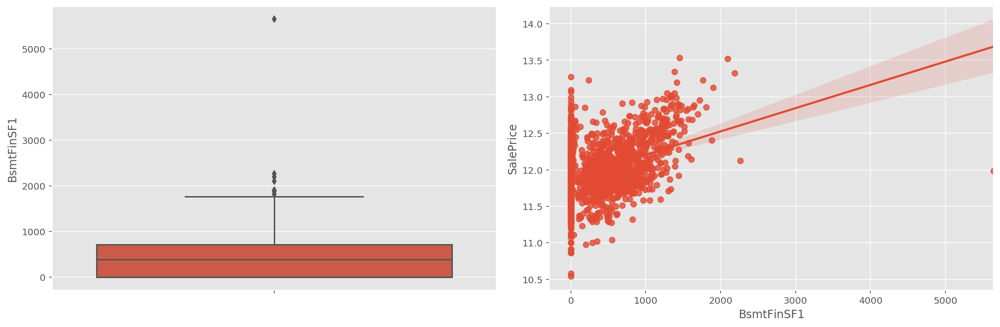

In [255]:
plot_outlier(house_df.BsmtFinSF1,house_df.SalePrice)

sample lengh: 1450   and skew: 4.238556137871783


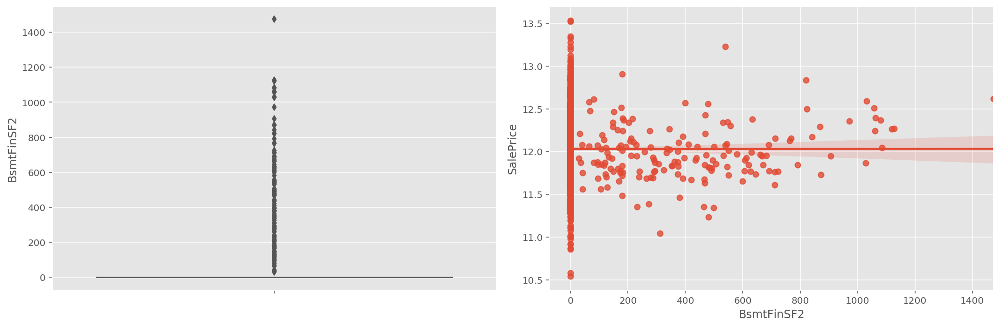

In [256]:
plot_outlier(house_df.BsmtFinSF2,house_df.SalePrice)

> Again there are a lot of 0's in this category and the regression line is horizontal, which makes me think that perhaps this isn't so much of an important feature. The regularization should take it out if it deems this variable not to have an effect on sale price. Anyhow, I believe GrLivArea, which combines the sqft of the property into one, more important and already encapsulates some of the individual features.

> To me this correlation is strange, why is the price higher the more unfinished basement are there is?

sample lengh: 1450   and skew: 0.9223044549909604


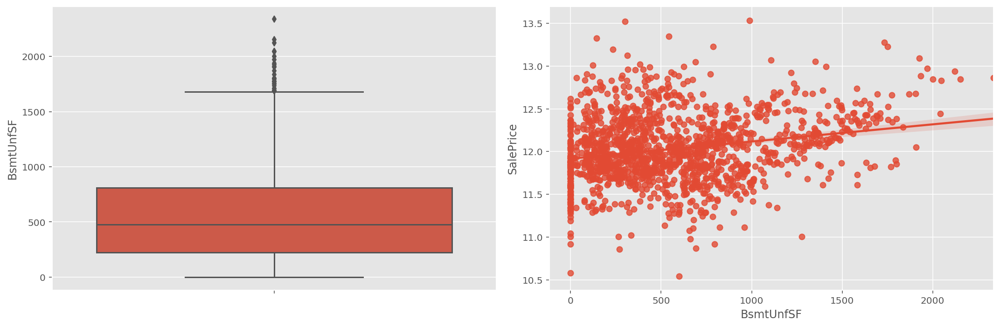

In [257]:
plot_outlier(house_df.BsmtUnfSF,house_df.SalePrice)

> Since TotalBsmtSF includes both BsmtFinSF1, BsmtFinSF2 and BsmtUnfSF. There will be much collinearity, which the model should remove.

sample lengh: 1450   and skew: 1.5206152430248054


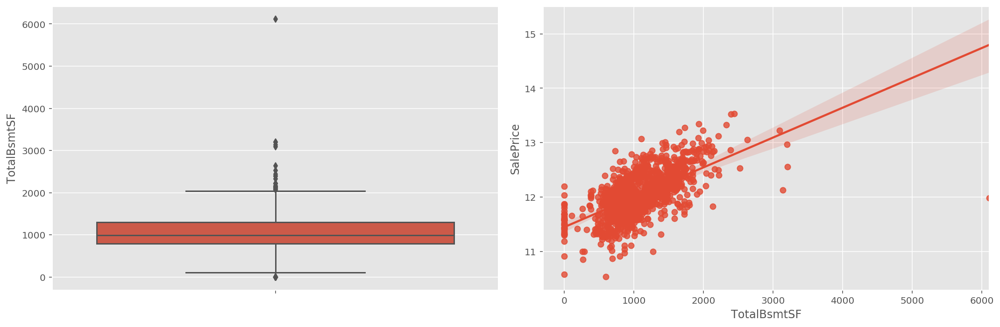

In [258]:
plot_outlier(house_df.TotalBsmtSF,house_df.SalePrice)

sample lengh: 1450   and skew: 1.3774651865498606


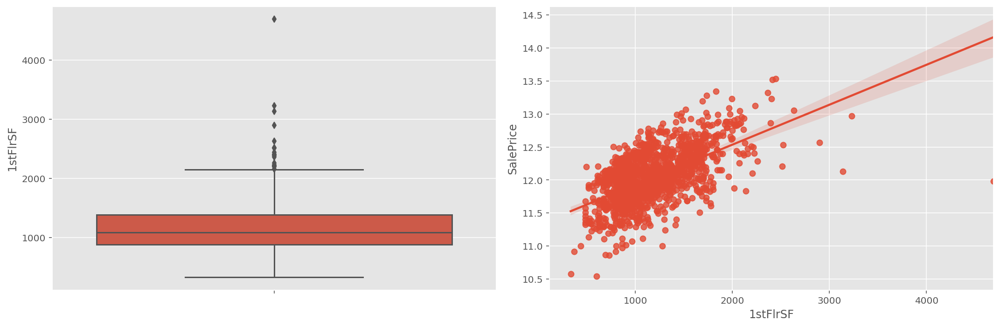

In [259]:
plot_outlier(house_df.loc[:,'1stFlrSF'],house_df.SalePrice)

> From 2ndFlrSF plot I can see that if there were no zeros the then there would be strong correlation between 2ndFlrSF and SalePrice. I wonder if this is a outlier in the information as surely this should only take in account those properties which have two floors.

sample lengh: 1450   and skew: 0.8115059190484086


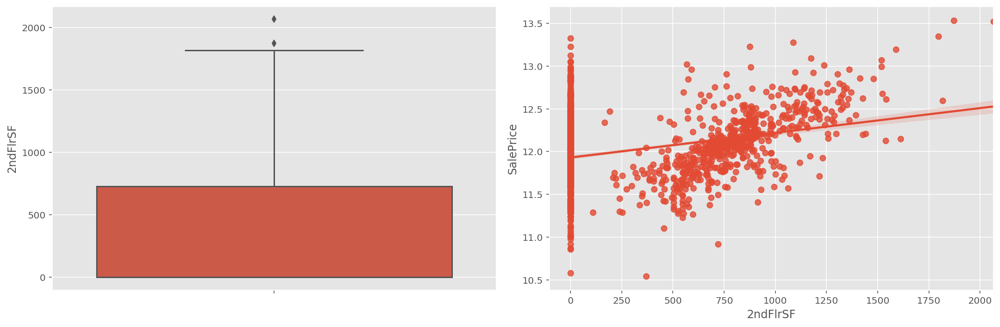

In [260]:
plot_outlier(house_df.loc[:,'2ndFlrSF'],house_df.SalePrice)

sample lengh: 1450   and skew: 9.237668822655218


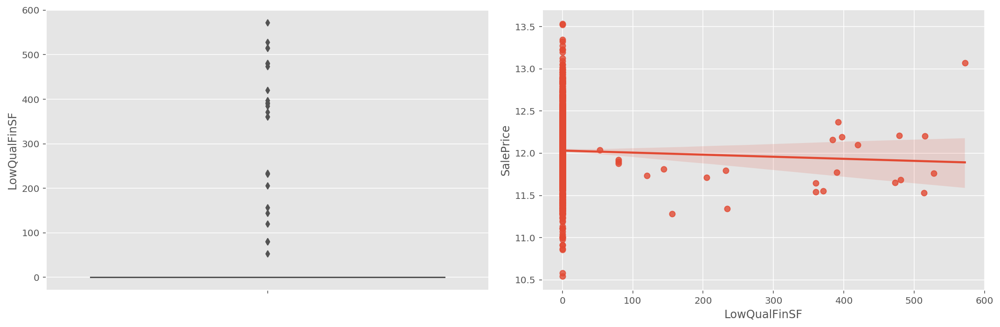

In [261]:
plot_outlier(house_df.LowQualFinSF,house_df.SalePrice)

> Since GrLivArea is a combination of 1stFlrSF and 2ndFlrSF, I will be using just that as a predictor in the modelling.

sample lengh: 1450   and skew: 1.373429752791864


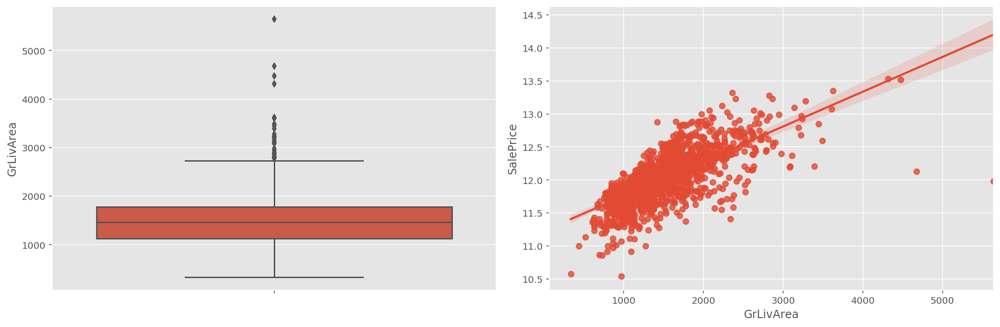

In [262]:
plot_outlier(house_df.GrLivArea,house_df.SalePrice)

sample lengh: 1450   and skew: 0.5880146851772597


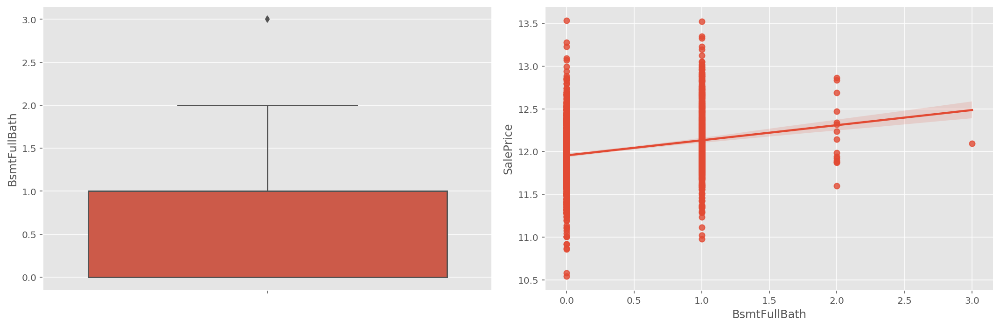

In [263]:
plot_outlier(house_df.BsmtFullBath,house_df.SalePrice)

sample lengh: 1450   and skew: 4.11902174139525


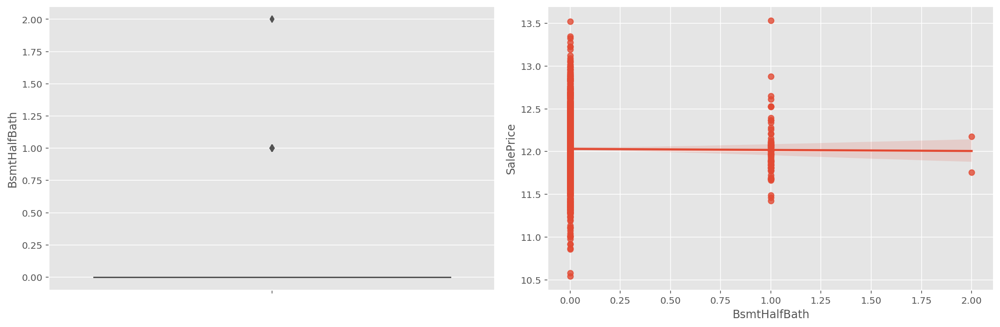

In [264]:
plot_outlier(house_df.BsmtHalfBath,house_df.SalePrice)

sample lengh: 1450   and skew: 0.037416740868910024


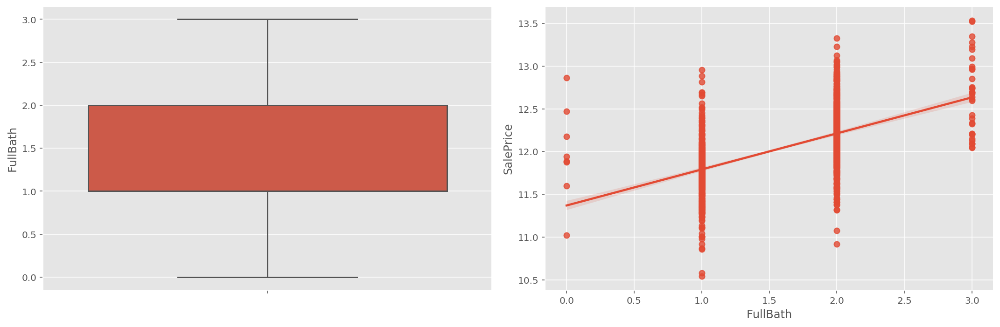

In [265]:
plot_outlier(house_df.FullBath,house_df.SalePrice)

sample lengh: 1450   and skew: 0.6681032927921233


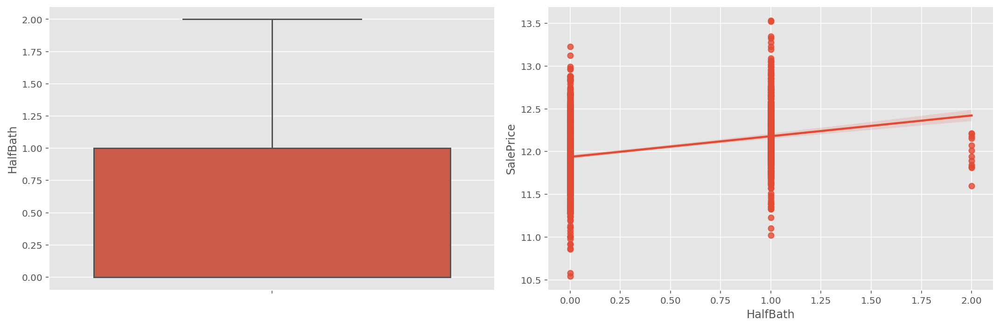

In [266]:
plot_outlier(house_df.HalfBath,house_df.SalePrice)

> Here again I created a new feature for the total baths

sample lengh: 1450   and skew: 0.21117049801783386


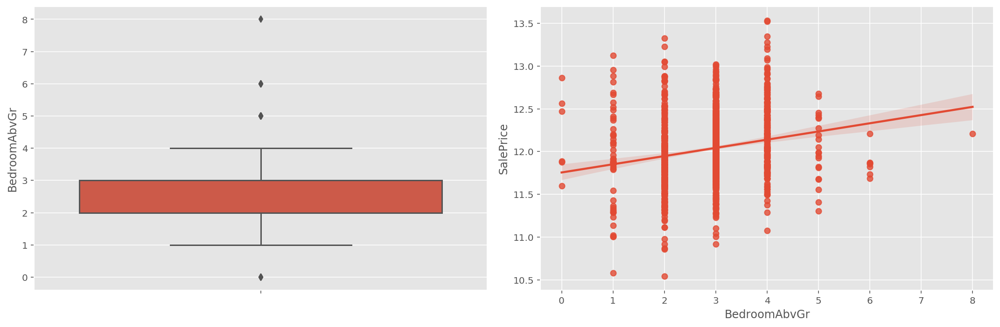

In [267]:
plot_outlier(house_df.BedroomAbvGr,house_df.SalePrice)

sample lengh: 1450   and skew: 0.6785250850518415


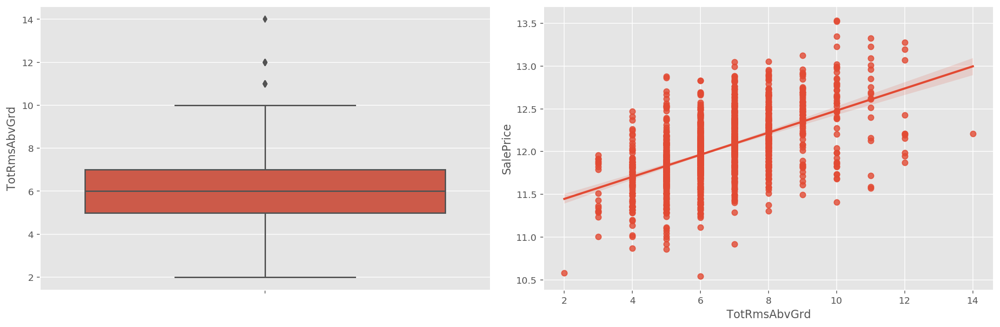

In [268]:
plot_outlier(house_df.TotRmsAbvGrd,house_df.SalePrice)

sample lengh: 1450   and skew: 0.6417796947587932


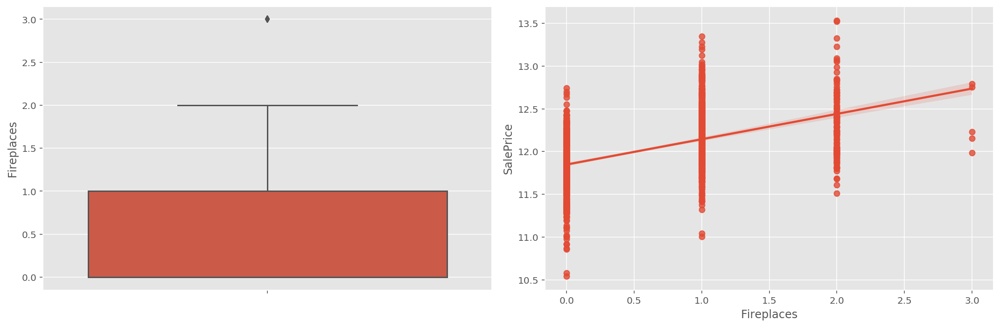

In [269]:
plot_outlier(house_df.Fireplaces,house_df.SalePrice)

sample lengh: 1450   and skew: 0.6583592107506306


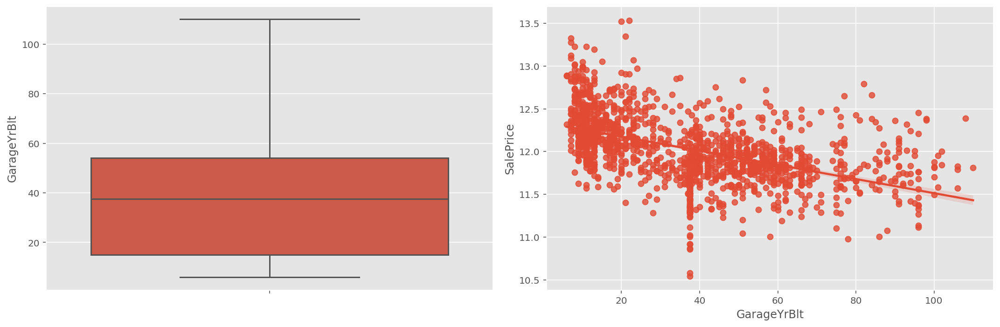

In [270]:
plot_outlier(2016-house_df.GarageYrBlt,house_df.SalePrice)

sample lengh: 1450   and skew: -0.34268104824443185


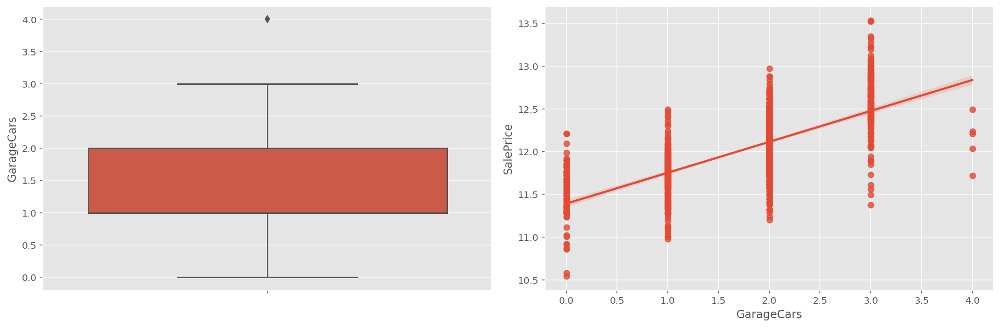

In [271]:
plot_outlier(house_df.GarageCars,house_df.SalePrice)

sample lengh: 1450   and skew: 0.16273905026095795


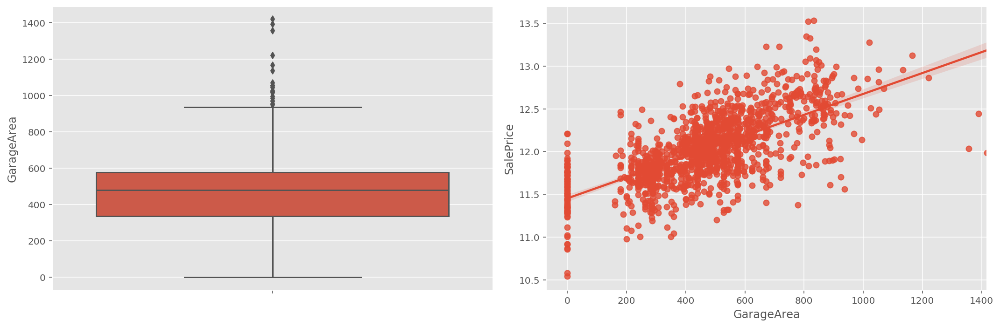

In [272]:
plot_outlier(house_df.GarageArea,house_df.SalePrice)

sample lengh: 1450   and skew: 1.5323105592969593


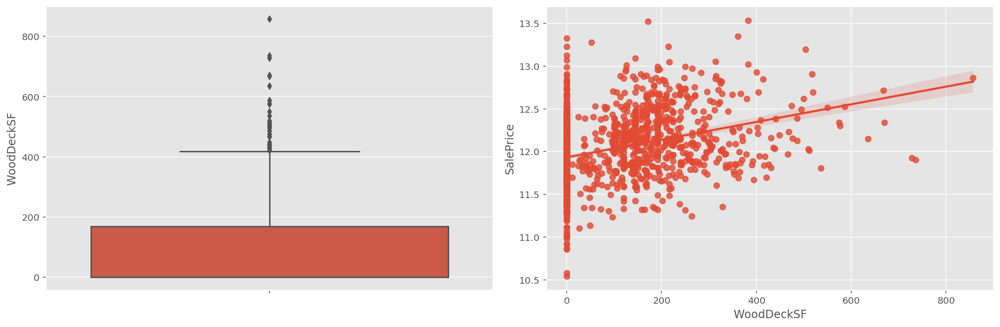

In [273]:
plot_outlier(house_df.WoodDeckSF,house_df.SalePrice)

sample lengh: 1450   and skew: 2.233622334441472


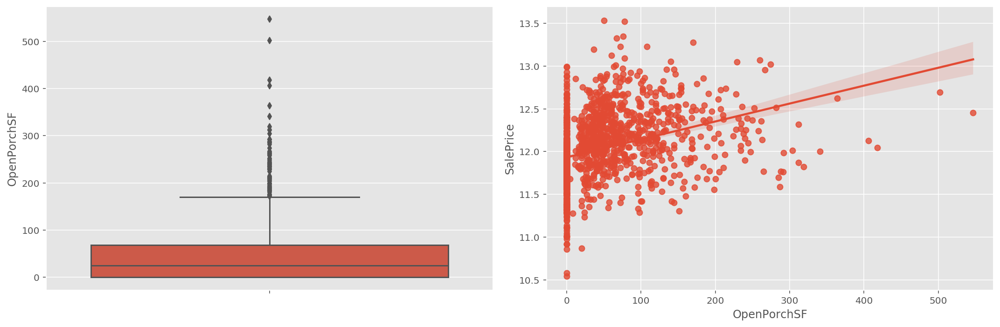

In [274]:
plot_outlier(house_df.OpenPorchSF,house_df.SalePrice)

sample lengh: 1450   and skew: 3.1419097218893057


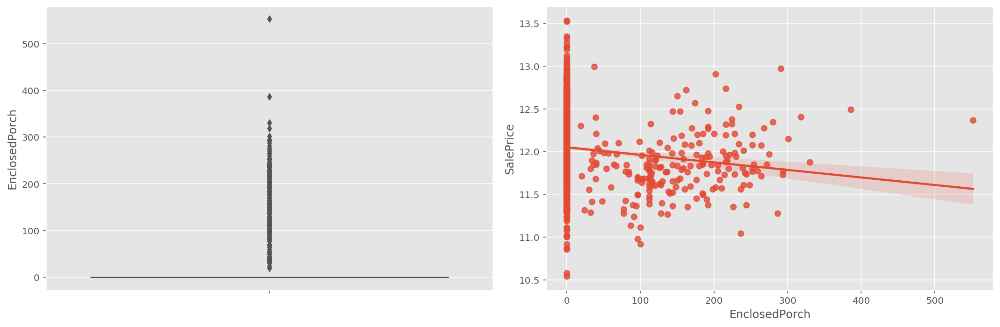

In [275]:
plot_outlier(house_df.EnclosedPorch,house_df.SalePrice)

sample lengh: 1450   and skew: 10.268112831227015


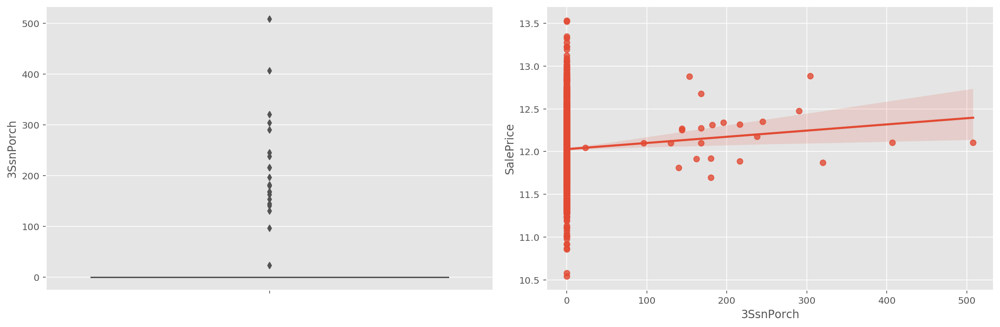

In [276]:
plot_outlier(house_df.loc[:,'3SsnPorch'],house_df.SalePrice)

sample lengh: 1450   and skew: 4.116348328840846


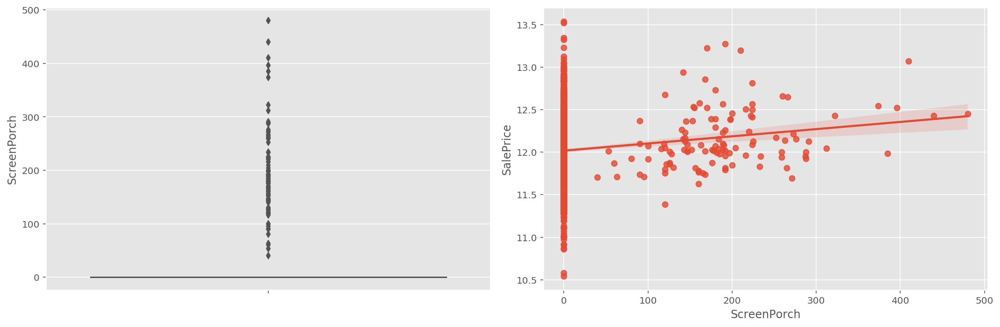

In [277]:
plot_outlier(house_df.ScreenPorch,house_df.SalePrice)

/Users/mymacbookpro/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  after removing the cwd from sys.path.


sample lengh: 1450   and skew: 1.0968571818363486


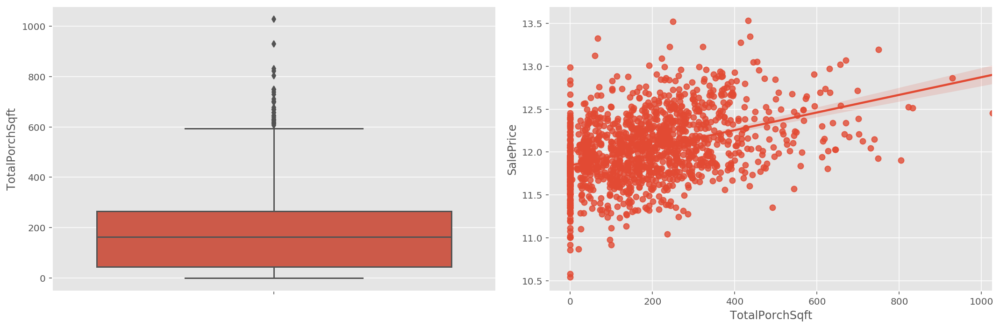

In [278]:
# I am creating a new feature as in a few of these related feature there is no significant trend between the variable 
# and the price. And it shows as the skew is relatively small with this new transformed feature.

house_df['TotalPorchSqft']=house_df['OpenPorchSF']+house_df['EnclosedPorch']+house_df.loc[:,'3SsnPorch']+house_df['ScreenPorch']++house_df['WoodDeckSF']
plot_outlier(house_df['TotalPorchSqft'],house_df.SalePrice)

sample lengh: 1450   and skew: 0.21956742214937644


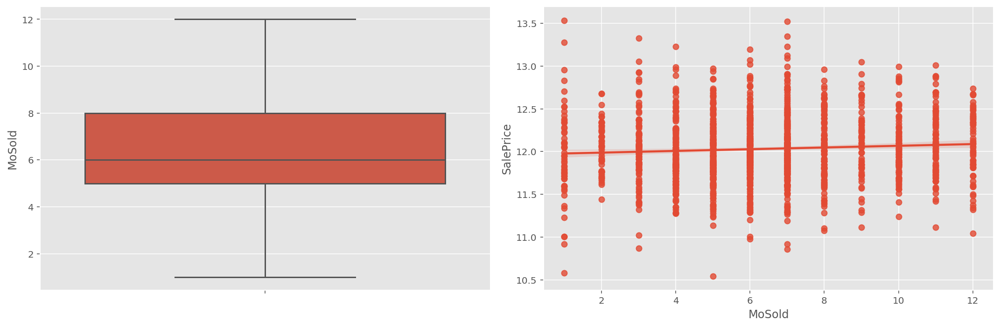

In [279]:
plot_outlier(house_df.MoSold,house_df.SalePrice)

sample lengh: 1450   and skew: 0.09834719260237351


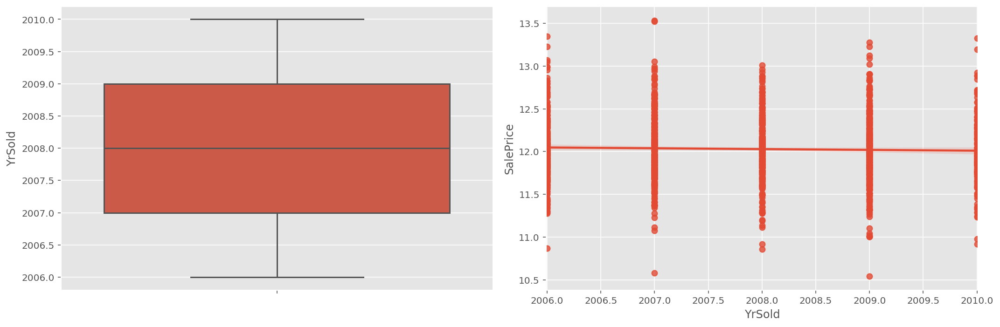

In [280]:
plot_outlier(house_df.YrSold, house_df.SalePrice)

In [281]:
house_df.shape

(1450, 82)

In [282]:
sp_table = house_df_corr['SalePrice'].sort_values(ascending=False).to_frame()
cm = sns.light_palette("green", as_cmap=True)
sp_corr = sp_table.style.background_gradient(cmap=cm)
sp_corr

,SalePrice
SalePrice,1.000000
OverallQual,0.790982
GrLivArea,0.708624
GarageCars,0.640409
GarageArea,0.623431
TotalBsmtSF,0.613581
1stFlrSF,0.605852
FullBath,0.560664
TotRmsAbvGrd,0.533723
YearBuilt,0.522897


IndexError: tuple index out of range

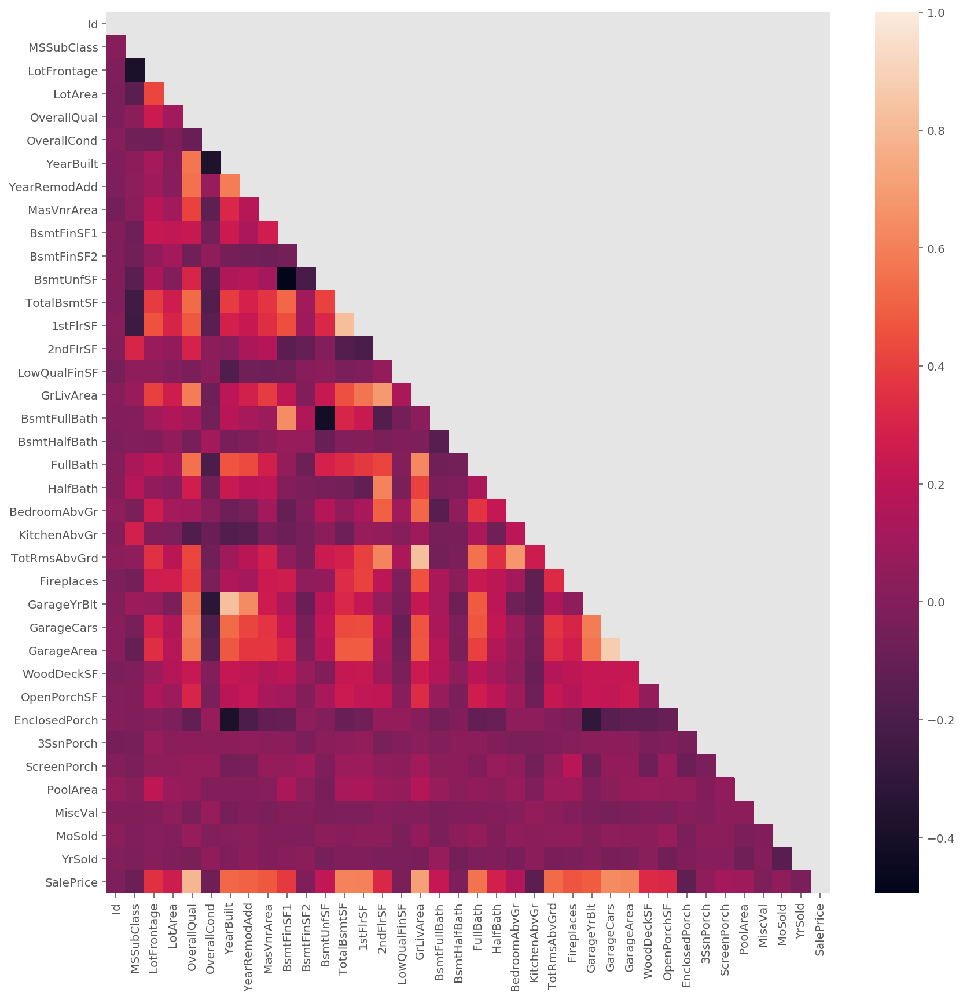

In [283]:
# Set the  matplotlib figure size:
fig, ax = plt.subplots(figsize=(14, 14))

# Generate a mask for the upper triangle (taken from seaborn example gallery)
mask = np.zeros_like(house_df_corr, dtype=np.bool)
mask[np.triu_indices_from(mask)] = True

# Plot the heatmap with seaborn.
# Assign the matplotlib axis the function returns. This will let us resize the labels.
sns.heatmap(house_df_corr, mask=mask, annot=False, ax=ax)
ax.set_ylim([house_df.shape[2], 0])
plt.show()

## Fixed Features

In [284]:
# Creating the variables - fixed_feature for referencing in the modelling. I only include the total squarefootage not 
# including the individual measurements as they all equal the total.

# For the modelling I am deciding to keep all the features. In a couple of trials I included
# fixed features but it seems that the the models had a better CV score and test score.

fixed_features = house_df[['SalePrice', 'MSZoning', 'Street', 'Alley', 'LotShape', 'LandContour', 'LotConfig', 
                            'LandSlope', 'MSSubClass', 'MiscFeature', 'HouseStyle', 'Neighborhood', 
                            'BedroomAbvGr', 'KitchenAbvGr', 'Condition1', 'Condition2', 'BldgType',
                            'YearBuilt', 'YearRemodAdd', 'MasVnrType', 'MasVnrArea', 'Foundation', 
                            'GarageType', 'GarageCars', 'GarageYrBlt', 'MoSold', 'YrSold', 'SaleType', 
                            'SaleCondition', 'LotFrontage', 'LotArea', 'Utilities', 'BsmtFullBath', 
                           'BsmtHalfBath', 'FullBath', 'HalfBath', 'TotRmsAbvGrd', 'TotalBsmtSF', 'TotalPorchSqft', 
                           'PoolArea', 'GrLivArea', 'GarageType', 'OpenPorchSF', 'EnclosedPorch', '3SsnPorch', 
                           'ScreenPorch']] 
fixed_features

,SalePrice,MSZoning,Street,Alley,LotShape,LandContour,LotConfig,LandSlope,MSSubClass,MiscFeature,...,TotRmsAbvGrd,TotalBsmtSF,TotalPorchSqft,PoolArea,GrLivArea,GarageType,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch
0,208500,RL,Pave,None,Reg,Lvl,Inside,Gtl,60,None,...,8,856,61,0,1710,Attchd,61,0,0,0
1,181500,RL,Pave,None,Reg,Lvl,FR2,Gtl,20,None,...,6,1262,298,0,1262,Attchd,0,0,0,0
2,223500,RL,Pave,None,IR1,Lvl,Inside,Gtl,60,None,...,6,920,42,0,1786,Attchd,42,0,0,0
3,140000,RL,Pave,None,IR1,Lvl,Corner,Gtl,70,None,...,7,756,307,0,1717,Detchd,35,272,0,0
4,250000,RL,Pave,None,IR1,Lvl,FR2,Gtl,60,None,...,9,1145,276,0,2198,Attchd,84,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1455,175000,RL,Pave,None,Reg,Lvl,Inside,Gtl,60,None,...,7,953,40,0,1647,Attchd,40,0,0,0
1456,210000,RL,Pave,None,Reg,Lvl,Inside,Gtl,20,None,...,7,1542,349,0,2073,Attchd,0,0,0,0
1457,266500,RL,Pave,None,Reg,Lvl,Inside,Gtl,70,Shed,...,9,1152,60,0,2340,Attchd,60,0,0,0
1458,142125,RL,Pave,None,Reg,Lvl,Inside,Gtl,20,None,...,5,1078,478,0,1078,Attchd,0,112,0,0


In [285]:
list(fixed_features.duplicated().unique())

[False]

## Changeable features

In [286]:
changeable_features = house_df[['SalePrice', 'OverallQual', 'OverallCond', 'PoolArea', 
                                'RoofStyle', 'RoofMatl', 'ExterQual', 'ExterCond', 'Exterior1st', 'Exterior2nd', 
                                'BsmtQual', 'GarageCond', 'PoolQC', 'BsmtFinType1', 'BsmtFinType2', 
                                'HeatingQC', 'KitchenQual', 'FireplaceQu', 'Fireplaces', 'GarageQual', 'BsmtCond', 
                                'GarageArea', 'GarageFinish', 'GarageCars', 
                                'PavedDrive', 'Fence', 'CentralAir', 'Electrical']]
changeable_features

,SalePrice,OverallQual,OverallCond,PoolArea,RoofStyle,RoofMatl,ExterQual,ExterCond,Exterior1st,Exterior2nd,...,Fireplaces,GarageQual,BsmtCond,GarageArea,GarageFinish,GarageCars,PavedDrive,Fence,CentralAir,Electrical
0,208500,7,5,0,Gable,CompShg,Gd,TA,VinylSd,VinylSd,...,0,TA,TA,548,RFn,2,Y,None,Y,SBrkr
1,181500,6,8,0,Gable,CompShg,TA,TA,MetalSd,MetalSd,...,1,TA,TA,460,RFn,2,Y,None,Y,SBrkr
2,223500,7,5,0,Gable,CompShg,Gd,TA,VinylSd,VinylSd,...,1,TA,TA,608,RFn,2,Y,None,Y,SBrkr
3,140000,7,5,0,Gable,CompShg,TA,TA,Wd Sdng,Wd Shng,...,1,TA,Gd,642,Unf,3,Y,None,Y,SBrkr
4,250000,8,5,0,Gable,CompShg,Gd,TA,VinylSd,VinylSd,...,1,TA,TA,836,RFn,3,Y,None,Y,SBrkr
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1455,175000,6,5,0,Gable,CompShg,TA,TA,VinylSd,VinylSd,...,1,TA,TA,460,RFn,2,Y,None,Y,SBrkr
1456,210000,6,6,0,Gable,CompShg,TA,TA,Plywood,Plywood,...,2,TA,TA,500,Unf,2,Y,MnPrv,Y,SBrkr
1457,266500,7,9,0,Gable,CompShg,Ex,Gd,CemntBd,CmentBd,...,2,TA,Gd,252,RFn,1,Y,GdPrv,Y,SBrkr
1458,142125,5,6,0,Hip,CompShg,TA,TA,MetalSd,MetalSd,...,0,TA,TA,240,Unf,1,Y,None,Y,FuseA


In [287]:
list(changeable_features.duplicated().unique())

[False, True]

In [288]:
changeable_features_corr = changeable_features.corr()

In [289]:
# These are the changeable features I will dummify, only if they are unordered and categorical

c = changeable_features_corr['SalePrice']
a = c[c.abs() > 0.2].index
a.to_list()

['SalePrice', 'OverallQual', 'Fireplaces', 'GarageArea', 'GarageCars']

In [290]:
changeable_features.OverallQual.unique()

array([ 7,  6,  8,  5,  9,  4, 10,  3,  1,  2])

## Creating dummy features

In [426]:
# I am only going to dummify Overall Qual as it is qualitative / categorical data. 
# The rest is quantitative. 

changeable_features_dum = pd.get_dummies(changeable_features, columns=['RoofStyle', 'RoofMatl', 'ExterQual', 
                                                                       'ExterCond', 'Exterior1st', 'Exterior2nd', 
                                                                       'BsmtQual', 'GarageCond', 'PoolQC', 
                                                                       'BsmtFinType1', 'BsmtFinType2', 'HeatingQC', 
                                                                       'KitchenQual', 'FireplaceQu', 'GarageQual', 
                                                                       'BsmtCond', 'GarageFinish', 'GarageCond', 
                                                                       'PavedDrive', 'PoolQC', 'Fence', 'CentralAir', 
                                                                       'Electrical', 'OverallQual', 'OverallCond'], 
                                    drop_first=True)

In [427]:
changeable_features.dtypes

SalePrice        int64
OverallQual      int64
OverallCond      int64
PoolArea         int64
RoofStyle       object
RoofMatl        object
ExterQual       object
ExterCond       object
Exterior1st     object
Exterior2nd     object
BsmtQual        object
GarageCond      object
PoolQC          object
BsmtFinType1    object
BsmtFinType2    object
HeatingQC       object
KitchenQual     object
FireplaceQu     object
Fireplaces       int64
GarageQual      object
BsmtCond        object
GarageArea       int64
GarageFinish    object
GarageCars       int64
PavedDrive      object
Fence           object
CentralAir      object
Electrical      object
dtype: object

In [428]:
changeable_features_dum.shape

(1450, 138)

In [429]:
list(changeable_features_dum.columns)

['SalePrice',
 'PoolArea',
 'Fireplaces',
 'GarageArea',
 'GarageCars',
 'RoofStyle_Gable',
 'RoofStyle_Gambrel',
 'RoofStyle_Hip',
 'RoofStyle_Mansard',
 'RoofStyle_Shed',
 'RoofMatl_CompShg',
 'RoofMatl_Membran',
 'RoofMatl_Metal',
 'RoofMatl_Roll',
 'RoofMatl_Tar&Grv',
 'RoofMatl_WdShake',
 'RoofMatl_WdShngl',
 'ExterQual_Fa',
 'ExterQual_Gd',
 'ExterQual_TA',
 'ExterCond_Fa',
 'ExterCond_Gd',
 'ExterCond_Po',
 'ExterCond_TA',
 'Exterior1st_AsphShn',
 'Exterior1st_BrkComm',
 'Exterior1st_BrkFace',
 'Exterior1st_CBlock',
 'Exterior1st_CemntBd',
 'Exterior1st_HdBoard',
 'Exterior1st_ImStucc',
 'Exterior1st_MetalSd',
 'Exterior1st_Plywood',
 'Exterior1st_Stone',
 'Exterior1st_Stucco',
 'Exterior1st_VinylSd',
 'Exterior1st_Wd Sdng',
 'Exterior1st_WdShing',
 'Exterior2nd_AsphShn',
 'Exterior2nd_Brk Cmn',
 'Exterior2nd_BrkFace',
 'Exterior2nd_CBlock',
 'Exterior2nd_CmentBd',
 'Exterior2nd_HdBoard',
 'Exterior2nd_ImStucc',
 'Exterior2nd_MetalSd',
 'Exterior2nd_Other',
 'Exterior2nd_Plywood

In [430]:
changeable_features_dum.drop_duplicates(inplace=True)
changeable_features_dum.shape

(1448, 138)

## Dummifying fixed features

In [431]:
fixed_features_dum = pd.get_dummies(fixed_features, columns=['MSZoning', 'Street', 'Alley', 'LotShape', 'LandContour', 
                                                             'LotConfig', 'LandSlope', 'MiscFeature', 'HouseStyle', 
                                                             'Neighborhood', 'Condition1', 'Condition2', 'BldgType', 
                                                             'MasVnrType', 'Foundation', 'YearBuilt', 'YearRemodAdd', 
                                                             'Foundation', 'GarageType', 'GarageYrBlt', 'SaleType', 
                                                             'SaleCondition', 'Utilities', 'GarageType'], 
                                    drop_first=True)

In [432]:
fixed_features.dtypes

SalePrice           int64
MSZoning           object
Street             object
Alley              object
LotShape           object
LandContour        object
LotConfig          object
LandSlope          object
MSSubClass          int64
MiscFeature        object
HouseStyle         object
Neighborhood       object
BedroomAbvGr        int64
KitchenAbvGr        int64
Condition1         object
Condition2         object
BldgType           object
YearBuilt           int64
YearRemodAdd        int64
MasVnrType         object
MasVnrArea        float64
Foundation         object
GarageType         object
GarageCars          int64
GarageYrBlt       float64
MoSold              int64
YrSold              int64
SaleType           object
SaleCondition      object
LotFrontage       float64
LotArea             int64
Utilities          object
BsmtFullBath        int64
BsmtHalfBath        int64
FullBath            int64
HalfBath            int64
TotRmsAbvGrd        int64
TotalBsmtSF         int64
TotalPorchSq

In [433]:
list(fixed_features_dum.columns)

['SalePrice',
 'MSSubClass',
 'BedroomAbvGr',
 'KitchenAbvGr',
 'MasVnrArea',
 'GarageCars',
 'MoSold',
 'YrSold',
 'LotFrontage',
 'LotArea',
 'BsmtFullBath',
 'BsmtHalfBath',
 'FullBath',
 'HalfBath',
 'TotRmsAbvGrd',
 'TotalBsmtSF',
 'TotalPorchSqft',
 'PoolArea',
 'GrLivArea',
 'OpenPorchSF',
 'EnclosedPorch',
 '3SsnPorch',
 'ScreenPorch',
 'MSZoning_RH',
 'MSZoning_RL',
 'MSZoning_RM',
 'Street_Pave',
 'Alley_None',
 'Alley_Pave',
 'LotShape_IR2',
 'LotShape_IR3',
 'LotShape_Reg',
 'LandContour_HLS',
 'LandContour_Low',
 'LandContour_Lvl',
 'LotConfig_CulDSac',
 'LotConfig_FR2',
 'LotConfig_FR3',
 'LotConfig_Inside',
 'LandSlope_Mod',
 'LandSlope_Sev',
 'MiscFeature_None',
 'MiscFeature_Othr',
 'MiscFeature_Shed',
 'MiscFeature_TenC',
 'HouseStyle_1.5Unf',
 'HouseStyle_1Story',
 'HouseStyle_2.5Fin',
 'HouseStyle_2.5Unf',
 'HouseStyle_2Story',
 'HouseStyle_SFoyer',
 'HouseStyle_SLvl',
 'Neighborhood_Blueste',
 'Neighborhood_BrDale',
 'Neighborhood_BrkSide',
 'Neighborhood_ClearCr',

In [434]:
fixed_features_dum.shape

(1450, 413)

> From the following I can see the spread of the data and particularly from the skew which tell me the postive of negative skew of the data. Where there is a quite a skew comparitively, it may be possible to log tranform the variables. In the above plots of numerical features I was able to identify data points where there were many outliers, which are the variables where there is the highest skew. By logging the skewed variables it is possible to normalize them so that they are comparable and the model can do a better job at predicting the sale price. However, you would have to ensure that whenever you fed the model new unseen data that all the data is processed in the same way. Normalizing mean ensuring that the mean is 0 and on either side of the distribution the value increments by 1.

In [435]:
for col in numerical_features:
    print('{:15}'.format(col), 
          'Mean: {:07.2f}'.format(house_df[col].mean())  ,
          '     ' ,
          'St Dev: {:08.2f}'.format(house_df[col].std())  ,
          '     ' ,
          'Skewness: {:05.2f}'.format(house_df[col].skew())  , 
          '     ' ,
          'Kurtosis: {:06.2f}'.format(house_df[col].kurt())
         )

Id              Mean: 0731.36       St Dev: 00421.55       Skewness: 00.00       Kurtosis: -01.20
MSSubClass      Mean: 0056.90       St Dev: 00042.27       Skewness: 01.40       Kurtosis: 001.56
LotFrontage     Mean: 0070.05       St Dev: 00022.02       Skewness: 02.39       Kurtosis: 022.00
LotArea         Mean: 10523.83       St Dev: 10012.19       Skewness: 12.18       Kurtosis: 202.08
OverallQual     Mean: 0006.11       St Dev: 00001.37       Skewness: 00.24       Kurtosis: 000.09
OverallCond     Mean: 0005.58       St Dev: 00001.11       Skewness: 00.73       Kurtosis: 001.09
YearBuilt       Mean: 1971.59       St Dev: 00030.02       Skewness: -0.63       Kurtosis: -00.40
YearRemodAdd    Mean: 1985.05       St Dev: 00020.55       Skewness: -0.51       Kurtosis: -01.26
MasVnrArea      Mean: 0104.40       St Dev: 00180.98       Skewness: 02.67       Kurtosis: 010.08
BsmtFinSF1      Mean: 0445.16       St Dev: 00456.35       Skewness: 01.69       Kurtosis: 011.16
BsmtFinSF2      Mea

## Log tranform the Sale Price

In [436]:
# # fixed_features = []

# # for i, col correlation values in correlations with saleprice3
# # if absolute value of correlation is larger than threshold (start with 0.2)
# # append the name of the feature to the list

# fixed_features = a.to_list()
# fixed_features.append('YrSold')

In [437]:
# pair wise correlations
# if high correlation between predictors probably not a good idea to include in model
# Sale Price and Overall Qual are highly correlated, so if one increases it is likely the 
# other egatively correlated - it does not add completely independant information. 
# It is not as complementary information. Those that are not not correlated maybe they
# don't have impact on price.

In [438]:
#The Sale price is positively skewed from this following graphs, which I will consider 
# adjusting for instead of removing outliers.

house_df.SalePrice.describe()

count      1450.000000
mean     181654.942069
std       79176.485241
min       37900.000000
25%      130000.000000
50%      163945.000000
75%      214000.000000
max      755000.000000
Name: SalePrice, dtype: float64

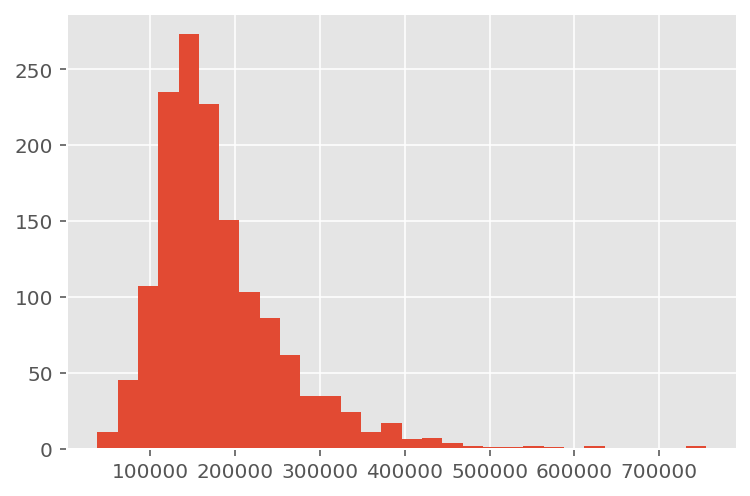

In [439]:
house_df.SalePrice.hist(bins=30)
plt.show()

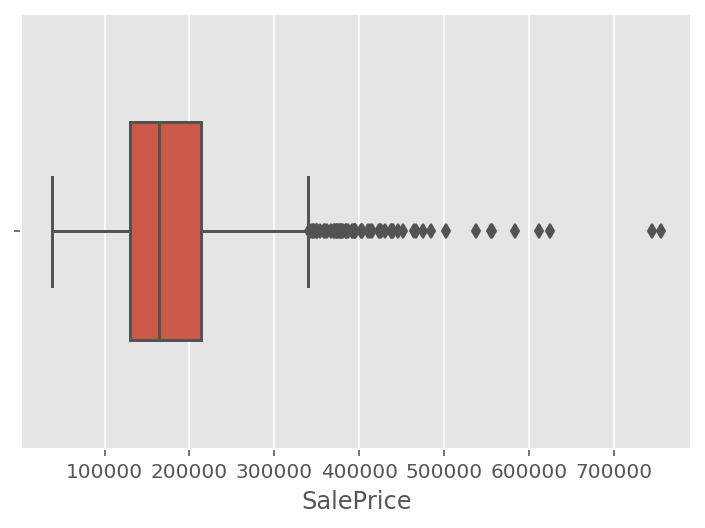

In [440]:
sns.boxplot(y=house_df["SalePrice"], orient='h', width=0.5)

> Since the sale price is not normally distribution and the data is positively skewed, which means and predictions won't be accurate especially on the unseen data I will log the sale price and will need to reverse the log price when I get to question 2.

## 3.  Create model

## Linear Regression Model

> The Linear Regression model tells me that the data is overfitting since the coefficients are very large. There are many variables in the fixed features that I am using to predict price and some a highly correlated. So the idea is that through regularization some of these less relevant features are reduced and are not used for prediction on the test set. So far I have not removed any features, even since I created some new ones I will let regularization do it's job.

In [442]:
from sklearn.linear_model import Ridge, Lasso, ElasticNet, LinearRegression, RidgeCV, LassoCV, ElasticNetCV
from sklearn.model_selection import cross_val_score, cross_val_predict, KFold
from sklearn.metrics import r2_score

In [443]:
from sklearn.model_selection import train_test_split, cross_val_score

In [444]:
from sklearn.preprocessing import StandardScaler

In [445]:
fixed_features_dum['1log1_sp'] = np.log1p(house_df['SalePrice'])

In [446]:
fixed_features_dum.drop(columns='SalePrice', inplace=True)

In [447]:
fixed_features_dum

,MSSubClass,BedroomAbvGr,KitchenAbvGr,MasVnrArea,GarageCars,MoSold,YrSold,LotFrontage,LotArea,BsmtFullBath,...,GarageType_CarPort,GarageType_Detchd,GarageType_None,GarageType_Attchd,GarageType_Basment,GarageType_BuiltIn,GarageType_CarPort,GarageType_Detchd,GarageType_None,1log1_sp
0,60,3,1,196.0,2,2,2008,65.0,8450,1,...,0,0,0,1,0,0,0,0,0,12.247699
1,20,3,1,0.0,2,5,2007,80.0,9600,0,...,0,0,0,1,0,0,0,0,0,12.109016
2,60,3,1,162.0,2,9,2008,68.0,11250,1,...,0,0,0,1,0,0,0,0,0,12.317171
3,70,3,1,0.0,3,2,2006,60.0,9550,1,...,0,1,0,0,0,0,0,1,0,11.849405
4,60,4,1,350.0,3,12,2008,84.0,14260,1,...,0,0,0,1,0,0,0,0,0,12.429220
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1455,60,3,1,0.0,2,8,2007,62.0,7917,0,...,0,0,0,1,0,0,0,0,0,12.072547
1456,20,3,1,119.0,2,2,2010,85.0,13175,1,...,0,0,0,1,0,0,0,0,0,12.254868
1457,70,4,1,0.0,1,5,2010,66.0,9042,0,...,0,0,0,1,0,0,0,0,0,12.493133
1458,20,2,1,0.0,1,4,2010,68.0,9717,1,...,0,0,0,1,0,0,0,0,0,11.864469


In [448]:
# Adding the tranformed sale price and popping from the y predictor.

In [449]:
X = fixed_features_dum.copy()
y = X.pop('1log1_sp')

In [450]:
# training on pre 2010 data and predicting on the 2010 data

In [451]:
X_train = X[X['YrSold'] < 2010]
X_test = X[X['YrSold'] == 2010]

y_train = y[X['YrSold'] < 2010]
y_test = y[X['YrSold'] == 2010]

In [452]:
# Creating Train Test split

In [453]:
# Standardising the data

In [454]:
scaler = StandardScaler()
X_train = pd.DataFrame(scaler.fit_transform(X_train), columns=X_train.columns)
X_test = pd.DataFrame(scaler.transform(X_test), columns=X_test.columns)

kf = KFold(n_splits=10, shuffle=True, random_state=1)
model = LinearRegression()

In [455]:
# Fitting the model and extracting the intercept and coefficient

In [456]:
model.fit(X_train, y_train)
model.intercept_, model.coef_

(12.032362084403294,
 array([-5.21849253e-02,  8.77188979e-04, -1.02272454e-02,  3.13200510e-03,
         6.09193114e-02,  2.26306384e-03, -1.48765730e-02, -1.71353812e-02,
         2.46515061e-02,  4.32207939e-02,  1.30911725e-02,  2.36805145e-02,
         1.76360205e-02,  1.42063181e-02,  1.15824857e-02,  2.69044604e-02,
        -9.61511622e-03,  1.51540781e-01,  1.16668183e-03,  2.53759694e-04,
         7.77926107e-03,  1.81955614e-02, -1.40497095e-02, -1.33668589e-02,
        -2.11952748e-02,  3.84821102e-03,  7.36278649e-04, -2.78964081e-03,
         5.70475935e-03, -1.11618585e-02, -5.79202165e-04,  1.74208475e-02,
         1.33984998e-02,  2.19697109e-02,  1.14374027e-02, -8.46277602e-03,
        -4.47975323e-03, -3.92362436e-03, -9.38806126e-04, -1.26171974e-02,
        -1.01094148e-02,  1.86709985e-03, -1.05859239e-02, -9.00477927e-03,
         3.65074464e-03,  5.94938171e-03,  2.58690906e-03,  1.35705739e-02,
        -1.94049400e-02,  1.89158873e-02,  1.62686845e-02, -2.13454

In [321]:
# Cross validating the X_train and y_train to determine how the model will work on unseen data in the test set.
cv_scores = cross_val_score(model, X_train, y_train, cv=kf)
print('CV scores:', cv_scores)
print('Mean CV score:', cv_scores.mean())

model.fit(X_train, y_train)
print('Training score:', model.score(X_train, y_train))

# The model score is pretty terrible and the variance score is way outside of 1, 
# which would suggest perfect prediction, whereas 0 means there is no linear relationship.
print('Test score:', model.score(X_test, y_test))

CV scores: [-2.75504669e+21 -1.98187902e+24 -2.59902013e+22 -1.74324708e+23
 -3.89010030e+24 -1.07549341e+25 -3.65049016e+20 -1.91500933e+20
 -2.34324197e+21 -2.95109498e+22]
Mean CV score: -1.6862394068103023e+24
Training score: 0.9125893074031113
Test score: -1.3112318372461375e+22


> I can see that the model is performing terribly, probably because of the collinearity between the various variables and since I did not remove any I can see that the model is overfitting. The model test score is pretty terrible and the variance score is way outside of 1, which would suggest perfect prediction, whereas 0 means there is no linear relationship.

In [322]:
print("Predictions:", model.predict(X_train))

Predictions: [12.22620688 12.0569564  12.28849326 ... 12.22516929 12.15183555
 11.86396323]


In [323]:
np.mean((model.predict(X_test) - y_test)**2)

2.0322127373460077e+21

In [324]:
print(X_train.shape, X_test.shape, y_train.shape, y_test.shape)

(1278, 412) (172, 412) (1278,) (172,)


In [325]:
df_coef = pd.DataFrame(model.coef_, index=X_train.columns,
                       columns=['coefficients'])
df_coef.head(60)

,coefficients
MSSubClass,-0.052185
BedroomAbvGr,0.000877
KitchenAbvGr,-0.010227
MasVnrArea,0.003132
GarageCars,0.060919
MoSold,0.002263
YrSold,-0.014877
LotFrontage,-0.017135
LotArea,0.024652
BsmtFullBath,0.043221


In [326]:
df_coef['coef_abs'] = df_coef.coefficients.abs()
df_coef.coef_abs.sort_values(ascending=False)

GarageType_Attchd     2.373551e+11
GarageType_Basment    2.212909e+11
GarageType_BuiltIn    1.888358e+11
GarageType_Detchd     1.587968e+11
GarageYrBlt_1942.0    1.517121e+11
                          ...     
YearBuilt_1937        2.320530e-05
YearBuilt_1924        1.798478e-05
YearRemodAdd_2010     3.814697e-06
GarageYrBlt_1927.0    2.753077e-07
GarageYrBlt_2010.0    0.000000e+00
Name: coef_abs, Length: 412, dtype: float64

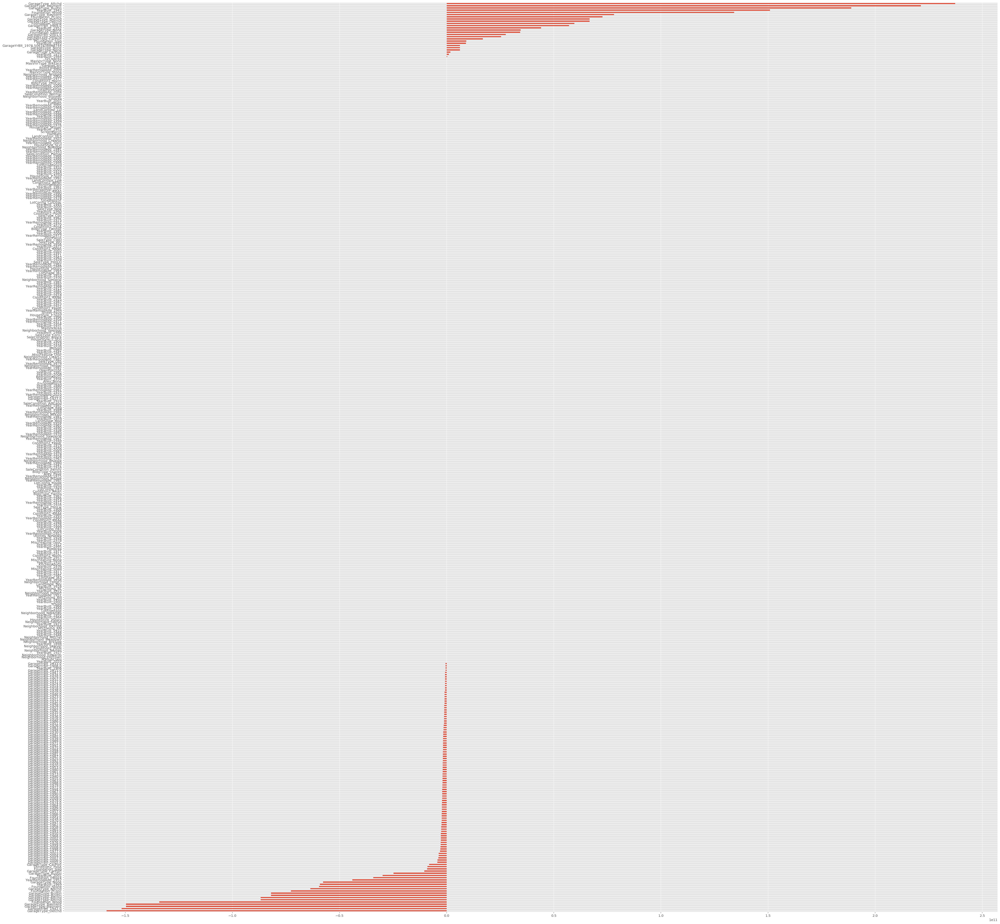

In [327]:
df_coef['coefficients'].sort_values().plot(kind='barh', figsize=(50,50))

## Lasso  model

> This Lasso model tells me that there is still some overfitting of the data since the Mean CV socre is lower that the training and test score so the model will not generalize to unseen data. When I plot the coeficcients I can see there are a lot of variables that have been zeroed out by the model. I could potentially remove them and if I re run the model again then some of the noise that is created by these additional variables would be diminished. Then the model would be vastly improved and would be able to predict house prices with less overfitting for a better score.

In [331]:
lassocv_model = LassoCV(alphas=np.logspace(-4, 4, 100), cv=5, max_iter=100000)
lassocv_model.fit(X_train, y_train)

scores = cross_val_score(lassocv_model, X_train, y_train, cv=5)
print('Best alpha:', lassocv_model.alpha_)
print('Training score:', lassocv_model.score(X_train, y_train))
print("Test Score:", lassocv_model.score(X_test, y_test))

Best alpha: 0.005994842503189409
Training score: 0.8643662086548307
Test Score: 0.8745818229483548


In [332]:
print("Cross-validated training scores:", scores)
print("Mean cross-validated training score:", scores.mean())
print("Standard deviation cross-validated training score:", scores.std())

Cross-validated training scores: [0.86672031 0.81248321 0.8220159  0.81884359 0.68668768]
Mean cross-validated training score: 0.801350140180956
Standard deviation cross-validated training score: 0.06046119014677103


In [333]:
# Now that we have the best alpha from Lasso CV, we run the Lasso
alpha = lassocv_model.alpha_
#Create the model instance
lasso = Lasso(alpha=alpha)
lasso.fit(X_train, y_train)

scores = cross_val_score(lasso, X_train, y_train, cv=5)
print("Cross-validated training scores:", scores)
print("Mean cross-validated training score:", scores.mean())
print("Standard deviation cross-validated training score:", scores.std())

print('Training score:', lasso.score(X_train, y_train))
print("Test Score:", lasso.score(X_test, y_test))

Cross-validated training scores: [0.87680276 0.81361158 0.82117896 0.82144002 0.69525964]
Mean cross-validated training score: 0.8056585926049591
Standard deviation cross-validated training score: 0.0596701025244172
Training score: 0.8643662086548307
Test Score: 0.8745818229483548


In [334]:
df_coef = pd.DataFrame(model.coef_, index=X_train.columns,
                       columns=['coefficients'])

In [335]:
df_coef['coef_abs'] = df_coef.coefficients.abs()
df_coef.coef_abs.sort_values(ascending=False)

GarageType_Attchd     2.373551e+11
GarageType_Basment    2.212909e+11
GarageType_BuiltIn    1.888358e+11
GarageType_Detchd     1.587968e+11
GarageYrBlt_1942.0    1.517121e+11
                          ...     
YearBuilt_1937        2.320530e-05
YearBuilt_1924        1.798478e-05
YearRemodAdd_2010     3.814697e-06
GarageYrBlt_1927.0    2.753077e-07
GarageYrBlt_2010.0    0.000000e+00
Name: coef_abs, Length: 412, dtype: float64

In [336]:
df_coef['coefficients'].sort_values().plot(kind='barh', figsize=(75,75));

## Ridge model

In [337]:
ridgecv_model = RidgeCV(alphas=np.logspace(1, 4, 200), cv=5)
ridgecv_model.fit(X_train, y_train)
print('Best alpha:', ridgecv_model.alpha_)
print('Training score:', ridgecv_model.score(X_train, y_train))
print('Test score:', ridgecv_model.score(X_test, y_test))

Best alpha: 488.02515836544336
Training score: 0.8832503679851205
Test score: 0.8482081200450016


In [338]:
#Get the cross validated scores
scores = cross_val_score(ridgecv_model, X_train, y_train, cv=5)
print('CV scores:', scores)
print('Mean CV score:', scores.mean())

CV scores: [0.84181273 0.79974722 0.81094313 0.81102947 0.70840428]
Mean CV score: 0.7943873682287668


In [339]:
print("Standard deviation cross-validated training score:", scores.std())

Standard deviation cross-validated training score: 0.04521512347133599


In [340]:
# Now that we have the best alpha from Ridge CV, we run the Ridge
alpha = ridgecv_model.alpha_
#Create the model instance
ridge = Ridge(alpha=alpha)

ridge.fit(X_train, y_train)
print('Training score:', ridge.score(X_train, y_train))
print('Test score:', ridge.score(X_test, y_test))

Training score: 0.8832503679851205
Test score: 0.8482081200450016


In [341]:
df_coef = pd.DataFrame(ridgecv_model.coef_, index=X_train.columns,
                       columns=['coefficients'])

In [342]:
df_coef['coef_abs'] = df_coef.coefficients.abs()
df_coef.coef_abs.sort_values(ascending=False)

GrLivArea             0.055857
GarageCars            0.040652
TotalBsmtSF           0.038104
TotRmsAbvGrd          0.032368
BsmtFullBath          0.030352
                        ...   
YearBuilt_1875        0.000000
YearRemodAdd_2010     0.000000
GarageYrBlt_1927.0    0.000000
GarageYrBlt_2010.0    0.000000
YearBuilt_2010        0.000000
Name: coef_abs, Length: 412, dtype: float64

In [343]:
df_coef['coefficients'].sort_values().plot(kind='barh', figsize=(70,70));

## Elasticnet model

> Here I am attempting to do an Elastic Net CV grid search to find the best parameters.

In [344]:
from sklearn.linear_model import ElasticNet
from sklearn.model_selection import GridSearchCV

In [345]:
# model = ElasticNetCV()

In [346]:
# parametersGrid = {"max_iter": [100000], 
#                   "n_alphas": [0.0001, 0.001, 0.01, 0.1, 1, 10, 100],
#                   "l1_ratio": np.arange(0.0, 1.0, 0.1)}

In [347]:
# gs = GridSearchCV(model, parametersGrid, cv=5, n_jobs=2, verbose=1)

In [348]:
# model.get_params().keys()

In [349]:
# gs.fit(X_train, y_train)

In [350]:
# # print out the best parameters. Looks like the model works best with more Lasso regularization
# gs.best_params_

In [351]:
# # print out the best mean cross-validated score
# gs.best_score_

In [352]:
# # assign your best estimator to the variable 'best_elasticnet'
# best_elasticnet = gs.best_estimator_

In [353]:
# best_elasticnet.score(X_train, y_train)

In [354]:
# # score your model on your testing data
# best_elasticnet.score(X_test, y_test)

In [355]:
# df_coef = pd.DataFrame(best_elasticnet.coef_, index=X_train.columns,
#                        columns=['coefficients'])

In [356]:
# df_coef['coef_abs'] = df_coef.coefficients.abs()
# df_coef.coef_abs.sort_values(ascending=False)

In [357]:
# df_coef['coefficients'].sort_values().plot(kind='barh', figsize=(100,100));

In [358]:
# create elastic net model instance
elasticcv_model = ElasticNetCV(alphas=np.logspace(-4, 4, 10000), 
                     l1_ratio=np.array([.1, .25, .5, 0.75, 1]),
                     cv=5, n_jobs=2)
#fit the model
elasticcv_model.fit(X_train, y_train)

ElasticNetCV(alphas=array([1.00000000e-04, 1.00184395e-04, 1.00369130e-04, ...,
       9.96322275e+03, 9.98159444e+03, 1.00000000e+04]),
             copy_X=True, cv=5, eps=0.001, fit_intercept=True,
             l1_ratio=array([0.1 , 0.25, 0.5 , 0.75, 1.  ]), max_iter=1000,
             n_alphas=100, n_jobs=2, normalize=False, positive=False,
             precompute='auto', random_state=None, selection='cyclic',
             tol=0.0001, verbose=0)

In [359]:
print('Best alpha:', elasticcv_model.alpha_)
print('Best l1-ratio:', elasticcv_model.l1_ratio_)

print('Training score:', elasticcv_model.score(X_train, y_train))
print("Test Score:", elasticcv_model.score(X_test, y_test))

Best alpha: 0.05875933981766238
Best l1-ratio: 0.1
Training score: 0.863909320942938
Test Score: 0.8719999407843901


> Since logging the SalePrice the l1 ratio change from 0.9 (towards Lasso) to 0.1 (mostly Ridge). And the Score increased from 0.5 to 0.80.

In [360]:
alpha = elasticcv_model.alpha_
l1_ratio = elasticcv_model.l1_ratio_
elasticnet = ElasticNet(alpha=alpha, l1_ratio=l1_ratio)

In [361]:
scores = cross_val_score(elasticnet, X_train, y_train, cv=5)
print('CV scores:', scores)
print('Mean CV score:', scores.mean())

elasticnet.fit(X_train, y_train)
print('Training score:', elasticnet.score(X_train, y_train))
print("Test Score:", elasticnet.score(X_test, y_test))

CV scores: [0.87374913 0.81439133 0.828178   0.82235122 0.70994136]
Mean CV score: 0.8097222070436155
Training score: 0.863909320942938
Test Score: 0.8719999407843901


In [362]:
df_coef = pd.DataFrame(elasticcv_model.coef_, index=X_train.columns,
                       columns=['coefficients'])

In [366]:
df_coef['coef_abs'] = df_coef.coefficients.abs()
df_coef.coef_abs.sort_values(ascending=False)[:10]

GrLivArea               0.103772
GarageCars              0.067752
TotalBsmtSF             0.042476
Neighborhood_NridgHt    0.036754
BsmtFullBath            0.035761
FullBath                0.034562
KitchenAbvGr            0.028958
TotalPorchSqft          0.027887
MSZoning_RM             0.023529
Neighborhood_Crawfor    0.023417
Name: coef_abs, dtype: float64

In [364]:
df_coef['coefficients'].sort_values().plot(kind='barh', figsize=(100,100));

## 4. Characterize your model. How well does it perform? What are the best estimates of price?

> I will be using the elastic net model since it worked best and is a mixture of the Lasso and Ridge. The model acheived a cross validation score of 0.809 vs 0.794 (Ridge) and 0.805 (Lasso). As mentioned above, since logging the SalePrice the l1 ratio change from 0.9 (towards Lasso) to 0.1 (mostly Ridge). And the Score increased from 0.5 to 0.80. This means that the model is modestly accuratly predict sales prices based on fixed features. As the CV was also quite consistent it means the model should generalise well to unseen data.

> The best predictors were GrLivArea, GarageCars, TotalBsmtSF, Neighborhood_NridgHt, BasmtFullBath.

> It makes sense that GrLivArea is top predictors since it is a combination of the first and second floor square feet. I am also quite surprised that BsmtFullBath made it to the top predictors (in hindsight this is quite strange that this appears here, so I would have considered creating a new feature to encompass all the baths). Less so surprised by Garage Cars seeing as if you own more cars you probably also have more disposable income and can afford more expensive houses. So the two are correlated.

> Seeing as the test scores and CV scores as quite consistent I am pretty confident in the accuracy of the model. In which case in future exmaples and modelling I will look at reviewing the fixed and changeable feature variables to check that there are no duplicates or potential variables that would skew the predictions and potentially look more closely at the variables that are skewed as I tranformed the SalePrice to a logarithmic scale, which did have an affect on the model accuracy.

> Also, since I didn't remove any features that had missing values I did replace some that were missing a small portion with the mean value. I should have feature engineered some more feature like I did with Total Porch, and I would have done this with Total Bath and Total Pool. 

> Below are the top 10 predictors:

In [367]:
df_coef['coef_abs'] = df_coef.coefficients.abs()
df_coef.coef_abs.sort_values(ascending=False)[:10]

GrLivArea               0.103772
GarageCars              0.067752
TotalBsmtSF             0.042476
Neighborhood_NridgHt    0.036754
BsmtFullBath            0.035761
FullBath                0.034562
KitchenAbvGr            0.028958
TotalPorchSqft          0.027887
MSZoning_RM             0.023529
Neighborhood_Crawfor    0.023417
Name: coef_abs, dtype: float64

<img src="http://imgur.com/l5NasQj.png" style="float: left; margin: 25px 15px 0px 0px; height: 25px">

## 2. Determine any value of *changeable* property characteristics unexplained by the *fixed* ones.

---

Now that you have a model that estimates the price of a house based on its static characteristics, we can move forward with part 2 and 3 of the plan: what are the costs/benefits of quality, condition, and renovations?

There are two specific requirements for these estimates:
1. The estimates of effects must be in terms of dollars added or subtracted from the house value. 
2. The effects must be on the variance in price remaining from the first model.

The residuals from the first model (training and testing) represent the variance in price unexplained by the fixed characteristics. Of that variance in price remaining, how much of it can be explained by the easy-to-change aspects of the property?

---

**Your goals:**
1. Evaluate the effect in dollars of the renovatable features. 
- How would your company use this second model and its coefficients to determine whether they should buy a property or not? Explain how the company can use the two models you have built to determine if they can make money. 
- Investigate how much of the variance in price remaining is explained by these features.
- Do you trust your model? Should it be used to evaluate which properties to buy and fix up?

> Reversing the log Sale Price so that I can compare in dollars

> In this section I am finding out what the residual or the remaining unexplained amount associated with Sale Price on the train then I see the different on the test and see what the explainable difference is made up of.

In [457]:
# prediction_train = np.exp(lasso.predict(X_train))
res_train = np.exp(y_train) - np.exp(lasso.predict(X_train))
res_train.shape

(1278,)

In [458]:
res_train

0        3634.329341
1        5452.918235
2       11662.720069
3      -60905.142564
4      -44677.996014
            ...     
1452    20074.465858
1453   -30219.767521
1454    -9797.970028
1455    -7749.503390
1459      208.343757
Name: 1log1_sp, Length: 1278, dtype: float64

In [459]:
prediction_test = np.expm1(lasso.predict(X_train))
res_test = np.exp(y_test) - np.exp(lasso.predict(X_test))
res_test.shape

(172,)

In [460]:
res_test

16       -558.391203
24       3894.533424
26       4458.974477
27       6628.279229
33      -7168.988043
            ...     
1438    13207.461608
1446    12565.369320
1456   -12933.793465
1457    65998.093047
1458    -1388.077481
Name: 1log1_sp, Length: 172, dtype: float64

## Create train and test split, dummify chanageable features variables, and standardise the variables

In [461]:
# fixed_features_res_train = res_train.abs()

In [462]:
# fixed_features_res_test = res_test.abs()

In [463]:
# resid_concat = pd.concat([res_train, res_test])

In [464]:
# fixed features split on years
#inpect numerically coded columns and whether they need to be included again
changeable_features_dum = pd.get_dummies(changeable_features, drop_first=True)
changeable_features_dum.shape
#how to interpret dummified features, read lecture notes

(1450, 115)

In [465]:
changeable_features_dum.pop('SalePrice')

0       208500
1       181500
2       223500
3       140000
4       250000
         ...  
1455    175000
1456    210000
1457    266500
1458    142125
1459    147500
Name: SalePrice, Length: 1450, dtype: int64

In [466]:
ren_train = changeable_features_dum[X['YrSold'] < 2010]
print(ren_train.shape, res_train.shape)

(1278, 114) (1278,)


In [467]:
ren_test = changeable_features_dum[X['YrSold'] == 2010]
print(ren_test.shape, res_test.shape)

(172, 114) (172,)


In [468]:
ren_test.head()

,OverallQual,OverallCond,PoolArea,Fireplaces,GarageArea,GarageCars,RoofStyle_Gable,RoofStyle_Gambrel,RoofStyle_Hip,RoofStyle_Mansard,...,Fence_GdWo,Fence_MnPrv,Fence_MnWw,Fence_None,CentralAir_Y,Electrical_FuseF,Electrical_FuseP,Electrical_Mix,Electrical_None,Electrical_SBrkr
16,6,7,0,1,480,2,1,0,0,0,...,0,0,0,1,1,0,0,0,0,1
24,5,8,0,1,270,1,1,0,0,0,...,0,1,0,0,1,0,0,0,0,1
26,5,7,0,0,576,2,1,0,0,0,...,0,0,0,1,1,0,0,0,0,1
27,8,5,0,1,772,3,1,0,0,0,...,0,0,0,1,1,0,0,0,0,1
33,5,5,0,1,447,2,0,0,1,0,...,0,0,0,1,1,0,0,0,0,1


In [469]:
scaler = StandardScaler()
ren_train = pd.DataFrame(scaler.fit_transform(ren_train), columns=ren_train.columns)
ren_test = pd.DataFrame(scaler.transform(ren_test), columns=ren_test.columns)

In [470]:
ren_train.head()

,OverallQual,OverallCond,PoolArea,Fireplaces,GarageArea,GarageCars,RoofStyle_Gable,RoofStyle_Gambrel,RoofStyle_Hip,RoofStyle_Mansard,...,Fence_GdWo,Fence_MnPrv,Fence_MnWw,Fence_None,CentralAir_Y,Electrical_FuseF,Electrical_FuseP,Electrical_Mix,Electrical_None,Electrical_SBrkr
0,0.633233,-0.521439,-0.073445,-0.970020,0.333297,0.292575,0.52968,-0.084215,-0.495595,-0.062672,...,-0.199674,-0.332173,-0.093177,0.478379,0.256687,-0.141252,-0.048507,-0.027984,-0.027984,0.311441
1,-0.091272,2.202262,-0.073445,0.593266,-0.074931,0.292575,0.52968,-0.084215,-0.495595,-0.062672,...,-0.199674,-0.332173,-0.093177,0.478379,0.256687,-0.141252,-0.048507,-0.027984,-0.027984,0.311441
2,0.633233,-0.521439,-0.073445,0.593266,0.611635,0.292575,0.52968,-0.084215,-0.495595,-0.062672,...,-0.199674,-0.332173,-0.093177,0.478379,0.256687,-0.141252,-0.048507,-0.027984,-0.027984,0.311441
3,0.633233,-0.521439,-0.073445,0.593266,0.769360,1.627973,0.52968,-0.084215,-0.495595,-0.062672,...,-0.199674,-0.332173,-0.093177,0.478379,0.256687,-0.141252,-0.048507,-0.027984,-0.027984,0.311441
4,1.357737,-0.521439,-0.073445,0.593266,1.669319,1.627973,0.52968,-0.084215,-0.495595,-0.062672,...,-0.199674,-0.332173,-0.093177,0.478379,0.256687,-0.141252,-0.048507,-0.027984,-0.027984,0.311441


In [471]:
ren_test.head()

,OverallQual,OverallCond,PoolArea,Fireplaces,GarageArea,GarageCars,RoofStyle_Gable,RoofStyle_Gambrel,RoofStyle_Hip,RoofStyle_Mansard,...,Fence_GdWo,Fence_MnPrv,Fence_MnWw,Fence_None,CentralAir_Y,Electrical_FuseF,Electrical_FuseP,Electrical_Mix,Electrical_None,Electrical_SBrkr
0,-0.091272,1.294362,-0.073445,0.593266,0.017848,0.292575,0.529680,-0.084215,-0.495595,-0.062672,...,-0.199674,-0.332173,-0.093177,0.478379,0.256687,-0.141252,-0.048507,-0.027984,-0.027984,0.311441
1,-0.815776,2.202262,-0.073445,0.593266,-0.956334,-1.042822,0.529680,-0.084215,-0.495595,-0.062672,...,-0.199674,3.010480,-0.093177,-2.090394,0.256687,-0.141252,-0.048507,-0.027984,-0.027984,0.311441
2,-0.815776,1.294362,-0.073445,-0.970020,0.463188,0.292575,0.529680,-0.084215,-0.495595,-0.062672,...,-0.199674,-0.332173,-0.093177,0.478379,0.256687,-0.141252,-0.048507,-0.027984,-0.027984,0.311441
3,1.357737,-0.521439,-0.073445,0.593266,1.372425,1.627973,0.529680,-0.084215,-0.495595,-0.062672,...,-0.199674,-0.332173,-0.093177,0.478379,0.256687,-0.141252,-0.048507,-0.027984,-0.027984,0.311441
4,-0.815776,-0.521439,-0.073445,0.593266,-0.135238,0.292575,-1.887932,-0.084215,2.017778,-0.062672,...,-0.199674,-0.332173,-0.093177,0.478379,0.256687,-0.141252,-0.048507,-0.027984,-0.027984,0.311441


In [472]:
# create a Linear Regression model instance, fits intercept by default
model = LinearRegression()

# get cross validated scores
scores = cross_val_score(model, ren_train, res_train, cv=10)
print("Cross-validated training scores:", scores)
print("Mean cross-validated training score:", scores.mean())
print("Standard deviation cross-validated training score:", scores.std())

model.fit(ren_train, res_train)
print('Training score:', model.score(ren_train, res_train))
print("Test Score:", model.score(ren_test, res_test))

Cross-validated training scores: [-7.94238780e+22 -1.05691243e+24 -9.75348788e+23 -1.19169362e-01
 -1.40340329e+23  2.11718877e-01  2.16836106e-01  1.40530403e-01
 -6.44531917e+23 -5.03918675e+23]
Mean cross-validated training score: -3.4004760201856824e+23
Standard deviation cross-validated training score: 4.009244836547056e+23
Training score: 0.6028319638245849
Test Score: -7.59791321212801e+19


In [473]:
# Create Lasso model instance

In [474]:
model = LassoCV(alphas=np.logspace(-5, 5, 2000), cv=5)
model.fit(ren_train, res_train)
print('Best Alpha: ', model.alpha_)
print('Training score: ', model.score(ren_train, res_train))
print('Test score: ', model.score(ren_test, res_test))

Best Alpha:  1795.25879711692
Training score:  0.2234847499077216
Test score:  0.13529297330614576


In [475]:
alpha = model.alpha_

# create a Lasso model instance
model_lasso_res = Lasso(alpha=alpha)

scores = cross_val_score(model_lasso_res, ren_train, res_train, cv=5)
print("Cross-validated training scores:", scores)
print("Mean cross-validated training score:", scores.mean())
print("Std for cross-validated training:", scores.std())

model_lasso_res.fit(ren_train, res_train)
print("Training Score:", model_lasso_res.score(ren_train, res_train))
print("Test Score:", model_lasso_res.score(ren_test, res_test))

Cross-validated training scores: [0.19854021 0.12134441 0.17943541 0.14613267 0.01586877]
Mean cross-validated training score: 0.1322642937169831
Std for cross-validated training: 0.0639954764821751
Training Score: 0.2234847499077216
Test Score: 0.13529297330614576


In [476]:
# Now that we have the best alpha from Lasso CV, we run the Lasso
alpha = model.alpha_
#Create the model instance
model_lasso_res = Lasso(alpha=alpha)

# get cross validated scores
scores = cross_val_score(model_lasso_res, ren_train, res_train, cv=5)
print("Cross-validated training scores:", scores)
print("Mean cross-validated training score:", scores.mean())
print("Standard deviation cross-validated training score:", scores.std())
# fit and evaluate the data on the whole training set
model_lasso_res.fit(ren_train, res_train)
print('Training score: ', model_lasso_res.score(ren_train, res_train))
print('Test score: ', model_lasso_res.score(ren_test, res_test))

Cross-validated training scores: [0.19854021 0.12134441 0.17943541 0.14613267 0.01586877]
Mean cross-validated training score: 0.1322642937169831
Standard deviation cross-validated training score: 0.0639954764821751
Training score:  0.2234847499077216
Test score:  0.13529297330614576


In [477]:
model = RidgeCV(alphas=np.linspace(13, 20, 1000), cv=5)

model.fit(ren_train, res_train)

print('Best alpha:', model.alpha_)
print('Training score:', model.score(ren_train, res_train))
print("Test Score:", model.score(ren_test, res_test))

Best alpha: 20.0
Training score: 0.5324879680744525
Test Score: 0.2473749798560668


In [478]:
alpha = model.alpha_

model_ridge_res = Ridge(alpha=alpha)

scores = cross_val_score(model_ridge_res, ren_train, res_train, cv=5)
print("Cross-validated training scores:", scores)
print("Mean cross-validated training score:", scores.mean())
print("Std for cross-validated training:", scores.std())

model_ridge_res.fit(ren_train, res_train)
print("Training Score:", model_ridge_res.score(ren_train, res_train))
print("Test Score:", model_ridge_res.score(ren_test, res_test))

Cross-validated training scores: [-1.70760129  0.06967126  0.19696327  0.15580424 -0.04101325]
Mean cross-validated training score: -0.2652351529986604
Std for cross-validated training: 0.7257767398117528
Training Score: 0.5324879680744525
Test Score: 0.2473749798560668


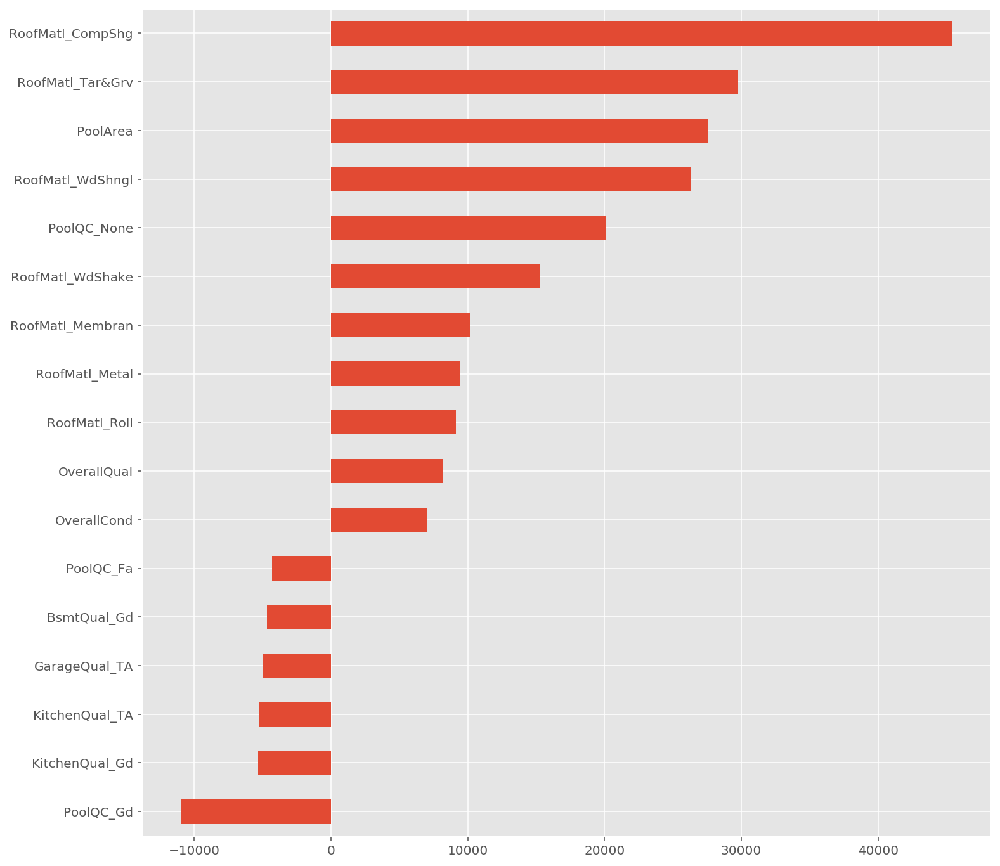

In [479]:
df_coef[df_coef.coef_abs > 4000]['coefficients'].sort_values().plot(kind='barh', figsize=(12, 12));

In [481]:
# collect the model coefficients in a dataframe
df_coef = pd.DataFrame(model_ridge_res.coef_, index=ren_train.columns,
                       columns=['coefficients'])
# calculate the absolute values of the coefficients
df_coef['coef_abs'] = df_coef.coefficients.abs()
df_coef[df_coef.coef_abs > 2000].sort_values(by='coefficients', ascending=False)

,coefficients,coef_abs
RoofMatl_CompShg,45454.988472,45454.988472
RoofMatl_Tar&Grv,29780.037238,29780.037238
PoolArea,27592.886464,27592.886464
RoofMatl_WdShngl,26360.354935,26360.354935
PoolQC_None,20110.220670,20110.220670
RoofMatl_WdShake,15273.629282,15273.629282
RoofMatl_Membran,10165.690205,10165.690205
RoofMatl_Metal,9440.851455,9440.851455
RoofMatl_Roll,9129.271720,9129.271720
OverallQual,8148.270317,8148.270317


Since the Ridge model performed the best, I will evaluate this one. From the list of cofficients RoofMatl_CompShg adds the most dollar value of 45,454 to the price of a house. The next down is RoofMatl_Tar&Grv, which would add 29,780 of value. Pool area makes it in, since it is a luxury to own a pool I would say that the larger the pool the more value it adds to a house, although I'm not sure about the integrity of this model if PoolQC_None made it the list. I presume again I should feature engineered an item for properties with and without pools to see the difference. 

I would expect Overall Cond and Overall Qual to be the item that would add the highest renovatable values to the house. However, this didn't make it very high up in the list. I believe although I conducted a clean of the data and feature engineering the models are still overfitting as you can see from the Mean CV and the train and test scores, where the mean CV is a lot lower. 

In terms of the features which reduced valued, having a PoolQC_Gd made it as the feature that reduced the price the most I feel is legitimate. It is probably quite expensive to repair the pool and so have a pool that is good and not in excellent condition is probably a factor that reduces the value of a house.

## 2 - How would your company use this model and its coefficients to determine whether they should buy a property or not? Explain how the company can use the two models you have built to determine if they can make money.

The coefficients of the second model determine which features in order can be rennovated to increase the value of the property and which ones to avoid renovating as they do not add value.

The real estate company can profit from the two models as follows:

For any property in the database, you can
	
1. use the fixed features to predict the property price. If the predicted price is higher than the current sale price, the real estate company can realise a profit simply by flipping the property.
2. if the predicted price is equal to or lower than the current sale price, then we move to the second model.
3. if the above condition is true, then we look at the renovatable features and modify the dummified values of the features, to see what is the improvement in predicted sale price vs the cost of conducting the renovations on each feature. 
4. If 1 and/or 3 in the list above return a value higher than the current price, the company should buy the property.
5. some sensible allowance for cost of sales, marketing, legal fees, and tax should be factored in to ensure the real estate company’s required margin is made on the transaction.

## 3 - Investigate how much of the variance in price remaining is explained by these features.

In [488]:
# total $ value of sales pre-2010
sum(np.exp(y_train))

232584220.0

In [483]:
# total res dollar value sales remaining after the fixed features
sum(res_train.abs())

23207743.56286716

In [492]:
res_pred_ridge = model_ridge_res.predict(ren_train)
res_pred_ridge

array([ 3484.40546441, 14946.34960301,  4639.39848675, ...,
        4948.60437872, -8590.73772097, -3071.58248492])

In [505]:
sum(res_train.abs()) - res_pred_ridge

array([23204259.15740275, 23192797.21326415, 23203104.16438041, ...,
       23202794.95848844, 23216334.30058813, 23210815.14535208])

In [487]:
sum(residual.abs())

20926008.601640493

## 4 - Do you trust your model? Should it be used to evaluate which properties to buy and fix up?

I don't trust the second model since the scores vary substantially and the mean CV score is low of 0.13 in the lasso, indicating that it is underfitting. Opposed to the first model where there were quite high CV and training and test scores consistently I can say that those models has a higher degree of accuracy in predicting prices against fixed features.

<img src="http://imgur.com/GCAf1UX.png" style="float: left; margin: 25px 15px 0px 0px; height: 25px">

## 3. What property characteristics predict an "abnormal" sale?

---

The `SaleCondition` feature indicates the circumstances of the house sale. From the data file, we can see that the possibilities are:

       Normal	Normal Sale
       Abnorml	Abnormal Sale -  trade, foreclosure, short sale
       AdjLand	Adjoining Land Purchase
       Alloca	Allocation - two linked properties with separate deeds, typically condo with a garage unit	
       Family	Sale between family members
       Partial	Home was not completed when last assessed (associated with New Homes)
       
One of the executives at your company has an "in" with higher-ups at the major regional bank. His friends at the bank have made him a proposal: if he can reliably indicate what features, if any, predict "abnormal" sales (foreclosures, short sales, etc.), then in return the bank will give him first dibs on the pre-auction purchase of those properties (at a dirt-cheap price).

He has tasked you with determining (and adequately validating) which features of a property predict this type of sale. 

---

**Your task:**
1. Determine which features predict the `Abnorml` category in the `SaleCondition` feature.
- Justify your results.

This is a challenging task that tests your ability to perform classification analysis in the face of severe class imbalance. You may find that simply running a classifier on the full dataset to predict the category ends up useless: when there is bad class imbalance classifiers often tend to simply guess the majority class.

It is up to you to determine how you will tackle this problem. It is recommended to do some research to find out how others have dealt with the problem in the past. Make sure to justify your solution. Don't worry about it being "the best" solution, but be rigorous.

Be sure to indicate which features are predictive (if any) and whether they are positive or negative predictors of abnormal sales.

In [ ]:
# A: